# 2022 EY Data Science Challenge - Level 1

## Challenge Level 1 Overview


Welcome to the 2022 EY Data Science Challenge! This is the first challenge aimed at beginner/intermediate participants that have little to no experience in data science and programming. For more experienced participants, we recommend undertaking challenge level 2 outlined [here](Model_Level_2.ipynb). If you choose to undertake the first level of the challenge, you will be developing a species distribution model (SDM) for one Australian frog species using only variables from the TerraClimate dataset. A species distribution model is a specific type of machine learning model that aims to predict the distribution of a biological species across geographic space and time. Such models have become increasingly important in conservation efforts globally to better understand and map the habitats of species of interest, particularly threatened or endangered species. 

The frog species identified for this challenge is Litoria fallax, the eastern dwarf tree frog pictured below. In addition to assisting our understanding of this specific frog species, a successful frog SDM will have broader implications in quantifying biodiversity. This is because frogs are incredibly sensitive to environmental changes, so any changes in their species distribution may indicate an underlying change to biodiversity in the area. 

<center>
<img src="files/frogs/Litoria_fallax.jpg" width="500" height="340">
</center>

<br>

**Challenge aim:** to develop a species distribution model for litoria fallax across Australia using weather data from the TerraClimate dataset.

| Challenge | Locations                     | Spatial Res        | Species          | Satellite Data                                                |
|-----------|-------------------------------|--------------------|------------------|---------------------------------------------------------------|
|***1***    | Australia                     | Coarse (4km)  | 1 species  | TerraClimate                                                  |
|2     | Australia, Costa Rica,<br>South Africa | Fine (10m)   | 15 species     | TerraClimate, Sentinel-2,<br>Land cover, water extent, elevation |

In this notebook, we will demonstrate a basic model workflow that can act as a starting point for the challenge. As specified in the first row of the table above, we will restrict this model to regions in Australia at coarse resolution (4kmx4km), predicting one species against the rest of the 5 specified Australian species using only [TerraClimate](https://planetarycomputer.microsoft.com/dataset/terraclimate) predictor variables. In this demonstation, we will be using four features from the TerraClimate dataset, the maximum monthly temperature, the minimum monthly temperature, the mean monthly precipitation, and the mean soil moisture, and will train a logistic regression model with these data. The TerraClimate data is sampled at a monthly temporal resolution, so metrics are calculated over the time dimension to simplify the features. We restrict this analysis to a five year window from the start of 2015 to the end of 2019, and will make the assumption that frog occurrences within that time period are representative of the entire time period (i.e. the frogs take longer than 5 years to move). 


Most of the functions present in this notebook were adapted from the following notebooks:
- [Training Dataset Summary](supplementary_notebooks/dataset_summary.ipynb)
- [TerraClimate/Weather](supplementary_notebooks/TerraClimate.ipynb)

Again, it must be noted that this notebook is just a starting point. We make plenty of assumptions in this notebook that you may not think are best for solving the challenge effectively. You are encouraged to modify these functions, to rewrite them completely, or to try a different approach entirely.


## Load in dependencies

To run this demonstration notebook, you will need to have the following packages imported below installed. This may take a while. 

In [49]:
# Supress Warnings 
import warnings
warnings.filterwarnings('ignore')

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns

# Data science
import pandas as pd
import numpy as np

# Machine Learning
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, accuracy_score, ConfusionMatrixDisplay
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_validate

# Geospatial
import contextily as cx
from shapely.geometry import Point, Polygon
import xarray as xr
import rasterio.features
import rasterio as rio
import fsspec

# API
import requests
import json

# Import Planetary Computer
import stackstac
import pystac
import pystac_client
import planetary_computer
import zipfile

# Other
import os
from itertools import cycle

# Folder to store extracted files
storage_path = './'

# Path to data folder with provided material
data_path = './'

## Response Variable

Before we can build our model, we need to load in the frog occurrences data and generate our response variable. To do this, we first need to unzip the training data and store it on our machine. Then we can write a function that abstracts the loading process, with the option of providing a bounding box to only take those occurrences within a region of interest.


In [2]:
if not os.path.exists(data_path):
    os.mkdir(data_path)
    with zipfile.ZipFile(data_path+'/GBIF_training_data.zip', 'r') as zip_ref:
        zip_ref.extractall(data_path)

In [2]:
def filter_bbox(frogs, bbox):
    frogs = frogs[lambda x: 
        (x.decimalLongitude >= bbox[0]) &
        (x.decimalLatitude >= bbox[1]) &
        (x.decimalLongitude <= bbox[2]) &
        (x.decimalLatitude <= bbox[3])
    ]
    return frogs

def get_frogs(file, year_range=None, bbox=None):
    """Returns the dataframe of all frog occurrences for the bounding box specified."""
    columns = [
        'gbifID','eventDate','country','continent','stateProvince',
        'decimalLatitude','decimalLongitude','species'
    ]
    country_names = {
        'AU':'Australia', 'CR':'Costa Rica', 'ZA':'South Africa','MX':'Mexico','HN':'Honduras',
        'MZ':'Mozambique','BW':'Botswana','MW':'Malawi','CO':'Colombia','PA':'Panama','NI':'Nicaragua',
        'BZ':'Belize','ZW':'Zimbabwe','SZ':'Eswatini','ZM':'Zambia','GT':'Guatemala','LS':'Lesotho',
        'SV':'El Salvador', 'AO':'Angola', np.nan:'unknown or invalid'
    }
    continent_names = {
        'AU':'Australia', 'CR':'Central America', 'ZA':'Africa','MX':'Central America','HN':'Central America',
        'MZ':'Africa','BW':'Africa','MW':'Africa','CO':'Central America','PA':'Central America',
        'NI':'Central America','BZ':'Central America','ZW':'Africa','SZ':'Africa','ZM':'Africa',
        'GT':'Central America','LS':'Africa','SV':'Central America','AO':'Africa', np.nan:'unknown or invalid' 
    }
    frogs = (
        pd.read_csv(data_path+'./occurrence.txt', sep='\t', parse_dates=['eventDate'])
        .assign(
            country =  lambda x: x.countryCode.map(country_names),
            continent =  lambda x: x.countryCode.map(continent_names),
            species = lambda x: x.species.str.title()
        )
        [columns]
    )
    if year_range is not None:
        frogs = frogs[lambda x: 
            (x.eventDate.dt.year >= year_range[0]) & 
            (x.eventDate.dt.year <= year_range[1])
        ]
    if bbox is not None:
        frogs = filter_bbox(frogs, bbox)
    return frogs

### Sub-sampling

For this demonstration, we will constrain our search to frogs in the Greater Sydney area found between the start of 2015 to the end of 2019. This gives a varied landscape of bushland, plains, rivers, and urban areas. This is done by providing `year_range` and `bbox` parameters to the get_frogs function we defined above.

In [3]:
# Define the bounding box for Greater Sydney, NSW
# region_name = 'Greater Sydney, NSW'
# min_lon, min_lat = (150.15, -34.25)  # Lower-left corner
# max_lon, max_lat = (151.15, -33.25)  # Upper-right corner
# bbox = (min_lon, min_lat, max_lon, max_lat)

# Load in data
all_frog_data = get_frogs(data_path+'/occurrence.txt', year_range=(2015, 2019))
all_frog_data = all_frog_data[all_frog_data['continent'] == 'Australia']
all_frog_data

,gbifID,eventDate,country,continent,stateProvince,decimalLatitude,decimalLongitude,species
7,1944370584,2018-04-18 19:05:00,Australia,Australia,New South Wales,-33.693144,151.320884,Litoria Fallax
17,2423011701,2019-08-28 09:24:00,Australia,Australia,New South Wales,-33.925746,151.164082,Litoria Fallax
21,2236299662,2018-02-13 23:02:00,Australia,Australia,New South Wales,-31.732415,152.088515,Litoria Fallax
23,2563750401,2017-10-25 21:07:00,Australia,Australia,New South Wales,-32.968624,151.644194,Litoria Fallax
33,1850994254,2017-11-30 08:35:00,Australia,Australia,New South Wales,-33.093048,151.416300,Litoria Fallax
...,...,...,...,...,...,...,...,...
193707,2420099493,2016-09-17 00:00:00,Australia,Australia,Victoria,-37.734715,144.328494,Crinia Signifera
193715,2420099296,2016-04-25 00:00:00,Australia,Australia,Victoria,-37.861180,144.268865,Crinia Signifera
193719,2420099324,2016-09-17 00:00:00,Australia,Australia,Victoria,-37.845236,144.354168,Crinia Signifera
193720,2420099687,2016-05-15 00:00:00,Australia,Australia,Victoria,-38.176213,144.355254,Crinia Signifera


#### Spatial sampling

While we have restricted our analysis to Greater Sydney for this demonstration,  you are encouraged to explore different areas to assist in creating a SDM that is representative of the habitat of litoria fallax. You could even use the entire training set, but keep in mind that loading in large areas may be quite computationally expensive. We recommend loading data in chunks that are a similar size to the bounding box we defined above.

#### Temporal sampling

Another area that may assist you in developing your SDM is the time dimension of the data. Each occurrence has an "eventDate" attribute, and the terraclimate data is taken monthly. You may want to consider whether more closely matching occurrences to timely data will improve your model. Another idea is to pool the data into larger time chunks like we have done in this notebook. This could involve extending our approach of binning the data in 5 year intervals to include occurrence data for 2010-2015, 2005-2009, etc. Either approach would allow you to utilise more of the training data which could greatly assist your SDM training.

### Addressing bias

Below we define some functions to assist in plotting the frog data. This will assist us in identifying two main areas of bias. We then use these functions to plot the frog species distributions of each country. A more detailed exploration of the training dataset for this challenge can be found in the [dataset summary notebook](supplementary_notebooks/dataset_summary.ipynb).

In [4]:
def plot_species(fig, ax, frog_data, region_name, cmap_params={'alpha':0.5}, scatter_params={'alpha':0.5}):
    # Bar chart
    bar_data = frog_data.species.value_counts()
    barchart = ax[1].bar(bar_data.index.str.replace(' ', '\n'), bar_data)

    # Colour cycle to ensure colors match in both plots
    prop_cycle = cycle(plt.rcParams['axes.prop_cycle'])
    for i, color in zip(range(len(bar_data)), prop_cycle):
        species_name = bar_data.index[i]
        if len(species_name) > 19:
            display_name = species_name.replace(' ', '\n')
        else:
            display_name = species_name
        barchart[i].set_color(color['color'])
        barchart[i].set_label(f"{display_name}\nCount: {bar_data[i]}")
        filt = frog_data.species == species_name
        # Scatter plot
        ax[0].scatter(
            frog_data[filt].decimalLongitude, 
            frog_data[filt].decimalLatitude, 
            marker='.', 
            color=color['color'],
            **scatter_params
        )

    # Add other features
    ax[0].set_title(f"Frog occurrences for {region_name}")
    # ax[0].set_xticklabels([])
    # ax[0].set_yticklabels([])
    ax[1].set_title(f"Frog species distribution in {region_name}")
    cx.add_basemap(ax[0], crs={'init':'epsg:4326'}, **cmap_params) # Add basemap
    ax[1].set_xticklabels(bar_data.index.str.replace(' ', '\n'), rotation=45)
    ax[1].legend()
    
    
def plot_barchart(bar_data, ax, bar_params={}, fold_text=True):
    barchart = ax.bar(bar_data.index, bar_data, **bar_params)
    prop_cycle = cycle(plt.rcParams['axes.prop_cycle'])
    for i, color in zip(range(len(bar_data)), prop_cycle):
        var_name = bar_data.index[i]
        barchart[i].set_color(color['color'])
        barchart[i].set_label(f"{var_name}\nCount: {bar_data[i]}")
    ax.set_xticklabels(bar_data.index.str.replace(' ', '\n'), rotation=45)
    ax.legend()

In [5]:
all_frog_data.species.value_counts()

species
Crinia Signifera             38685
Litoria Fallax               18701
Crinia Glauerti               5326
Ranoidea Australis            1114
Austrochaperina Pluvialis       62
Name: count, dtype: int64

Below, we can visualise the frog species distribution of the area. Here, only two of the five Australian species are present: crinia signifera, the common eastern froglet, and litoria fallax, the eastern dwarf tree frog.

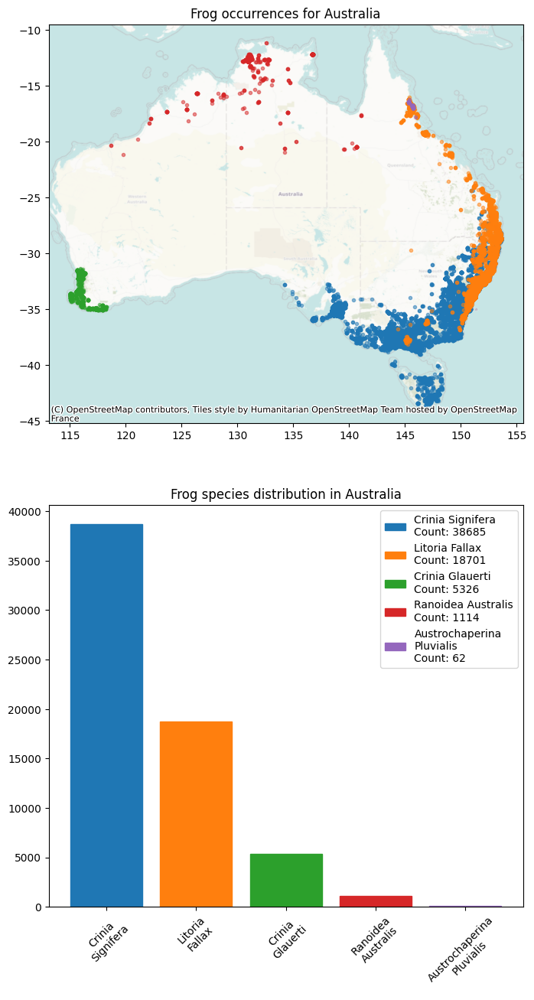

In [6]:
region_name= "Australia"
fig, ax = plt.subplots(2, 1, figsize=(8, 15))
plot_species(fig, ax, all_frog_data, region_name)

#### Sampling bias

The plot above shows how frog occurrences are heavily biased around urban areas, where people are more likely to come across them. They also cluster tightly around towns, parks, bush trails etc. This is one issue that would be worth addressing to maximise success in this challenge.

One method of addressing the sampling bias inherent in the database is to use the occurrence points of other species as absence points for the target species. This is called pseudo-absence and is a common technique in species distribution modelling. This way, if a different species of frog has been sighted in a specific location, we can be more certain that the species we are trying to predict is not at that same location. Alternatively, if we just picked a random point where there are no frog occurrences, we cannot be certain that frogs are not in that location. It might just be that there are no walking tracks near that location, and therefore the frogs would not show up in our database.

For this notebook, we will use the other species, crinia signifera - the common eastern froglet, as examples of litoria fallax's absence. We will alter our response variable to be `occurenceStatus` which will take the value of 1 if the occurrence species is litoria fallax, and 0 if the species is not litoria fallax (i.e. is crinia signifera).

In [7]:
target_species = 'Litoria Fallax'

all_frog_data = (
    all_frog_data
    # Assign the occurrenceStatus to 1 for the target species and 0 for all other species.
    # as well as a key for joining (later)
    .assign(
        occurrenceStatus = lambda x: np.where(x.species == target_species, 1, 0)
    )
)
all_frog_data

,gbifID,eventDate,country,continent,stateProvince,decimalLatitude,decimalLongitude,species,occurrenceStatus
7,1944370584,2018-04-18 19:05:00,Australia,Australia,New South Wales,-33.693144,151.320884,Litoria Fallax,1
17,2423011701,2019-08-28 09:24:00,Australia,Australia,New South Wales,-33.925746,151.164082,Litoria Fallax,1
21,2236299662,2018-02-13 23:02:00,Australia,Australia,New South Wales,-31.732415,152.088515,Litoria Fallax,1
23,2563750401,2017-10-25 21:07:00,Australia,Australia,New South Wales,-32.968624,151.644194,Litoria Fallax,1
33,1850994254,2017-11-30 08:35:00,Australia,Australia,New South Wales,-33.093048,151.416300,Litoria Fallax,1
...,...,...,...,...,...,...,...,...,...
193707,2420099493,2016-09-17 00:00:00,Australia,Australia,Victoria,-37.734715,144.328494,Crinia Signifera,0
193715,2420099296,2016-04-25 00:00:00,Australia,Australia,Victoria,-37.861180,144.268865,Crinia Signifera,0
193719,2420099324,2016-09-17 00:00:00,Australia,Australia,Victoria,-37.845236,144.354168,Crinia Signifera,0
193720,2420099687,2016-05-15 00:00:00,Australia,Australia,Victoria,-38.176213,144.355254,Crinia Signifera,0


#### Class Balancing

Another bias shown in the above visualisations is the class imbalance. To handle this, we will down-sample the absence points so that their numbers match that of the target species. Note that this is quite a naive approach as an isolated frog occurrence may be lost while clusters of occurrences are more likely to persist. This may not be ideal, as these isolated occurrences are often the most important data points available for frog conservationists. Developing a smarter sampling method may be a worthwhile pursuit when considering ways to improve your model.

The barcharts below show the response variable before and after the classes have been balanced.

Text(0.5, 1.0, 'Balanced training set')

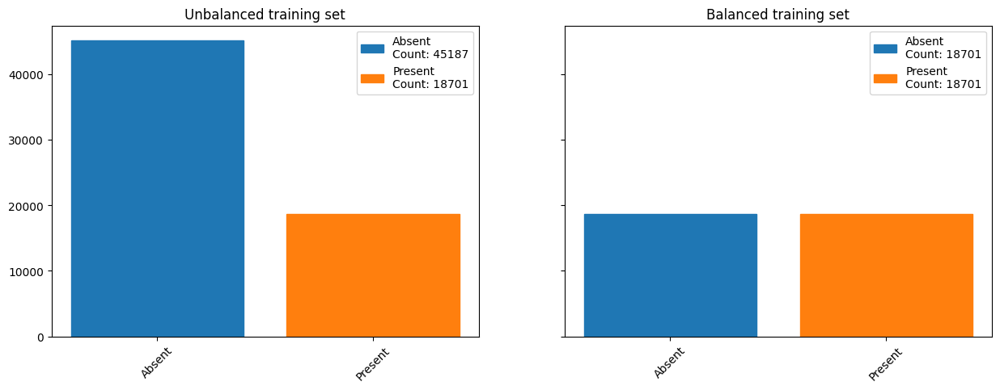

In [8]:
target_species_frog_data = all_frog_data[all_frog_data.occurrenceStatus == 1]
frog_data = (
    all_frog_data
    [all_frog_data.occurrenceStatus == 0]
    .sample(
        len(target_species_frog_data), random_state=420
    )
)
frog_data = pd.concat(
    [frog_data, target_species_frog_data]
    ).reset_index(drop=True).assign(key=lambda x: x.index)

# Bar charts
fig, ax = plt.subplots(1, 2, figsize = (15, 5), sharey=True, sharex=True)
bar_data = all_frog_data.occurrenceStatus.map({1:'Present', 0:'Absent'}).value_counts()
plot_barchart(bar_data, ax[0], bar_params={})
ax[0].set_title('Unbalanced training set')
balanced_bar_data = frog_data.occurrenceStatus.map({1:'Present', 0:'Absent'}).value_counts()
plot_barchart(balanced_bar_data, ax[1], bar_params={})
ax[1].set_title('Balanced training set')

After assigning absence points and balancing the classes, we finally have our training data visualised below. Again, it must be stressed that this is just one way of addressing the sampling bias and class imbalances inherent in the GBIF data and it does not address these biases completely. Since we will be using this training dataset for evaluation, the evaluation metrics will also contain bias. You are encouraged to improve the response variable creation process until you are confident in its ability to accurately train and evaluate your SDM for litoria fallax. For now, we will continue with this training set.


In [9]:
import copy
frog_data = copy.copy(all_frog_data)
frog_data['key'] = np.arange(frog_data.shape[0])
frog_data.reset_index(drop=True, inplace=True)
frog_data.columns

Index(['gbifID', 'eventDate', 'country', 'continent', 'stateProvince',
       'decimalLatitude', 'decimalLongitude', 'species', 'occurrenceStatus',
       'key'],
      dtype='object')

Text(0.5, 1.0, 'Training set for Australia')

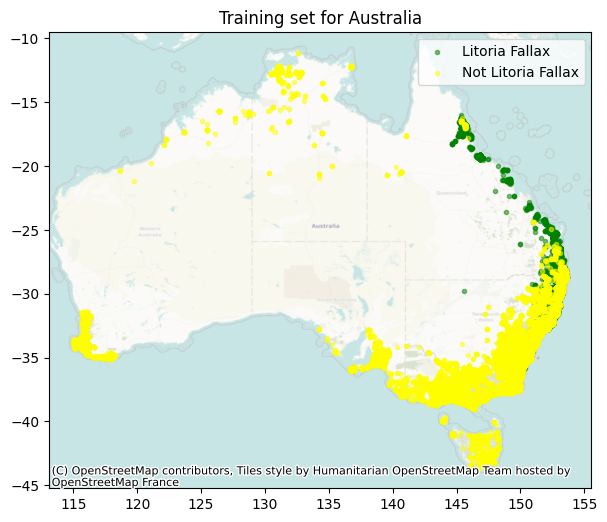

In [10]:
fig, ax = plt.subplots(figsize = (7, 7))

filt = frog_data.occurrenceStatus == 1
ax.scatter(frog_data[filt].decimalLongitude, frog_data[filt].decimalLatitude,
           color = 'green', marker='.', alpha=0.5, label=target_species)
ax.scatter(frog_data[~filt].decimalLongitude, frog_data[~filt].decimalLatitude,
           color = 'yellow', marker='.', alpha=0.5, label=f"Not {target_species}")
ax.legend()
cx.add_basemap(ax, crs={'init':'epsg:4326'}, alpha=0.5)
ax.set_title(f"Training set for {region_name}")

## Predictor Variables

Now that we have our response variable, it is time to gather the predictor variables from the TerraClimate dataset. For a more in-depth look at the TerraClimate dataset and how to query it, see the [TerraClimate supplementary notebook](./supplementary_notebooks/TerraClimate.ipynb)

### Accessing the TerraClimate Data

To get the TerraClimate data, we write a function called `get_terraclimate`. This function will fetch all data intersecting with the bounding box and will calculate various metrics over the time dimension for each coordinate. In this example, we will take four metrics from four assets, namely the mean maximum monthly air temp (`tmax_mean`), mean minimum monthly air temp (`tmin_mean`), mean accumulated precipitation (`ppt_mean`) and mean soil moisture (`soil_mean`), all calculated over a five year timeframe from the start of 2015 to the end of 2019.

To assist in visualisations, this function has an interpolation functionality which will allow the comparitively coarse temporal resolution of the terraclimate data to be mapped to a larger set of coordinates, creating an ($n$ x $m$) image. We will choose (512 x 512).


Below, we define the products to take from TerraClimate in `assets` and the metrics to calculate from them in `tc_metrics`. Each metric is applied to each asset, so to pick the desired asset/metric pairs we define a list of strings in the form '\<asset\>_\<metric\>' in `features`. 

Don't run from here

In [39]:
collection = pystac.read_file("https://planetarycomputer.microsoft.com/api/stac/v1/collections/terraclimate")
asset = collection.assets["zarr-https"]
store = fsspec.get_mapper(asset.href)
data = xr.open_zarr(store)#, **asset.extra_fields["xarray:open_kwargs"])
data

<xarray.Dataset> Size: 2TB
Dimensions:  (time: 768, lat: 4320, lon: 8640, crs: 1)
Coordinates:
  * crs      (crs) int16 2B 3
  * lat      (lat) float64 35kB 89.98 89.94 89.9 89.85 ... -89.9 -89.94 -89.98
  * lon      (lon) float64 69kB -180.0 -179.9 -179.9 ... 179.9 179.9 180.0
  * time     (time) datetime64[ns] 6kB 1958-01-01 1958-02-01 ... 2021-12-01
Data variables: (12/14)
    aet      (time, lat, lon) float32 115GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
    def      (time, lat, lon) float32 115GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
    pdsi     (time, lat, lon) float32 115GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
    pet      (time, lat, lon) float32 115GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
    ppt      (time, lat, lon) float64 229GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
    q        (time, lat, lon) float64 229GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
    ...       ...
    swe      (time, lat, lon) float64 229GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
    tmax     (time, lat, lon) float32 115GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
    tmin     (time, lat, lon) float32 115GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
    vap      (time, lat, lon) float32 115GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
    vpd      (time, lat, lon) float32 115GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
    ws       (time, lat, lon) float32 115GB dask.array<chunksize=(12, 1024, 1024), meta=np.ndarray>
Attributes: (12/52)
    Conventions:                     CF-1.6
    acknowledgment:                  Please cite the references included here...
    cdm_data_type:                   GRID
    contributor_email:               khegewisch@ucmerced.edu
    contributor_name:                Katherine Hegewisch
    contributor_role:                Postdoctoral Fellow
    ...                              ...
    time_coverage_duration:          P1Y
    time_coverage_end:               1958-12-01T00:0
    time_coverage_resolution:        P1M
    time_coverage_start:             1958-01-01T00:0
    title:                           TerraClimate: monthly climate and climat...
    version:                         v1.0

In [50]:
lat_coords = frog_data['decimalLatitude'].to_xarray()
long_coords = frog_data['decimalLongitude'].to_xarray()
time_coords = frog_data['eventDate'].dt.strftime('%Y-%m-%d').to_xarray()


In [52]:
selected_data = data.sel(lat=lat_coords, lon=long_coords, time=time_coords, method='nearest')
selected_data

<xarray.Dataset> Size: 6MB
Dimensions:  (index: 63888, crs: 1)
Coordinates:
  * crs      (crs) int16 2B 3
    lat      (index) float64 511kB -33.69 -33.94 -31.73 ... -37.85 -38.19 -33.77
    lon      (index) float64 511kB 151.3 151.1 152.1 151.6 ... 144.4 144.4 151.1
    time     (index) datetime64[ns] 511kB 2018-05-01 2019-09-01 ... 2015-09-01
  * index    (index) int64 511kB 0 1 2 3 4 5 ... 63883 63884 63885 63886 63887
Data variables: (12/14)
    aet      (index) float32 256kB dask.array<chunksize=(63888,), meta=np.ndarray>
    def      (index) float32 256kB dask.array<chunksize=(63888,), meta=np.ndarray>
    pdsi     (index) float32 256kB dask.array<chunksize=(63888,), meta=np.ndarray>
    pet      (index) float32 256kB dask.array<chunksize=(63888,), meta=np.ndarray>
    ppt      (index) float64 511kB dask.array<chunksize=(63888,), meta=np.ndarray>
    q        (index) float64 511kB dask.array<chunksize=(63888,), meta=np.ndarray>
    ...       ...
    swe      (index) float64 511kB dask.array<chunksize=(63888,), meta=np.ndarray>
    tmax     (index) float32 256kB dask.array<chunksize=(63888,), meta=np.ndarray>
    tmin     (index) float32 256kB dask.array<chunksize=(63888,), meta=np.ndarray>
    vap      (index) float32 256kB dask.array<chunksize=(63888,), meta=np.ndarray>
    vpd      (index) float32 256kB dask.array<chunksize=(63888,), meta=np.ndarray>
    ws       (index) float32 256kB dask.array<chunksize=(63888,), meta=np.ndarray>
Attributes: (12/52)
    Conventions:                     CF-1.6
    acknowledgment:                  Please cite the references included here...
    cdm_data_type:                   GRID
    contributor_email:               khegewisch@ucmerced.edu
    contributor_name:                Katherine Hegewisch
    contributor_role:                Postdoctoral Fellow
    ...                              ...
    time_coverage_duration:          P1Y
    time_coverage_end:               1958-12-01T00:0
    time_coverage_resolution:        P1M
    time_coverage_start:             1958-01-01T00:0
    title:                           TerraClimate: monthly climate and climat...
    version:                         v1.0

In [53]:
check = selected_data.to_dataframe()
check

,,aet,def,lat,lon,pdsi,pet,ppt,q,soil,srad,swe,time,tmax,tmin,vap,vpd,ws
index,crs,,,,,,,,,,,,,,,,,
0,3,28.300001,64.700005,-33.687500,151.312500,-5.10,93.000000,28.3,1.4,13.400001,131.601486,0.0,2018-05-01,22.299999,10.800000,1.148,0.70,4.10
1,3,90.800003,7.400000,-33.937500,151.145833,-2.80,98.200005,86.2,4.3,116.900002,200.599091,0.0,2019-09-01,20.500000,9.800000,1.132,0.69,3.80
2,3,139.800003,0.000000,-31.729167,152.104167,-4.50,139.800003,153.2,7.7,38.000000,251.401993,0.0,2018-02-01,28.199999,15.799999,1.698,0.86,3.10
3,3,80.300003,62.500000,-32.979167,151.645833,-3.70,142.800003,75.6,3.8,32.000000,246.703949,0.0,2017-11-01,24.799999,15.400000,1.540,0.68,4.05
4,3,78.900002,96.900002,-33.104167,151.395833,-3.70,175.800003,78.3,3.9,22.300001,270.403198,0.0,2017-12-01,28.900000,17.299999,1.656,0.91,3.64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63883,3,98.200005,13.200000,-37.729167,144.312500,-2.40,111.400002,87.5,4.4,40.100002,205.004013,0.0,2016-10-01,17.400000,6.900000,0.901,0.52,6.02
63884,3,56.700001,16.900000,-37.854167,144.270833,-5.50,73.599998,59.4,3.0,3.800000,88.802979,0.0,2016-05-01,17.199999,8.900000,0.991,0.44,5.51
63885,3,79.500000,36.000000,-37.854167,144.354167,-2.30,115.500000,79.5,4.0,12.300000,205.198151,0.0,2016-10-01,18.199999,7.800000,0.960,0.55,6.38


In [56]:
check2 = check.reset_index(drop=True)

In [57]:
check2.to_csv('real_australia_full_train_data.csv')

Don't run till here

### Visualising the TerraClimate Data

The spatial distribution of the four variables are displayed below.

['cool', 'cool', 'Blues', 'BrBG', 'cool', 'cool', 'cool', 'cool', 'cool', 'cool', 'cool', 'cool', 'cool']


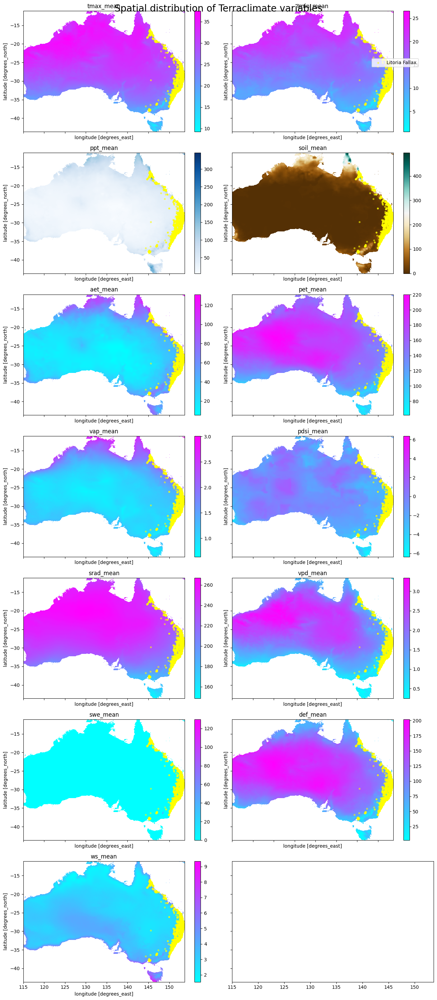

In [16]:
# bands = weather_data.band.values
# filt = frog_data.occurrenceStatus == 1

# nrow = len(bands) // 2 + (len(bands) % 2)
# ncol = 2
# fig, ax = plt.subplots(nrow, ncol, figsize=(13, 30), sharex=True, sharey=True)

# cmaps = ["cool", "cool", "Blues", "BrBG"] + ['cool'] * (len(bands) - 4)
# print(cmaps)
# for i in range(len(bands)):
#     xr.plot.imshow(weather_data[i], 'x', 'y', cmap=cmaps[i], ax=ax[i//ncol, i%ncol]) 
#     ax[i//ncol, i%ncol].set_title(bands[i])
#     ax[i//ncol, i%ncol].scatter(frog_data[filt].decimalLongitude, frog_data[filt].decimalLatitude,
#                                 color = 'yellow', marker='.', alpha=0.5, label=target_species if i==0 else '')

# fig.suptitle("Spatial distribution of Terraclimate variables", fontsize=20)
# fig.legend(loc=(0.85, 0.933))
# fig.tight_layout()

### Feature engineering

The frequency distribution of each variable is displayed below. There is some skewness present in a few variables, so you might want to address this when training your own model. Depending on the type of model you decide to train, some of the variables might require normalisation, standardisation, or transformation. For now, we will proceed with the variables as they come.

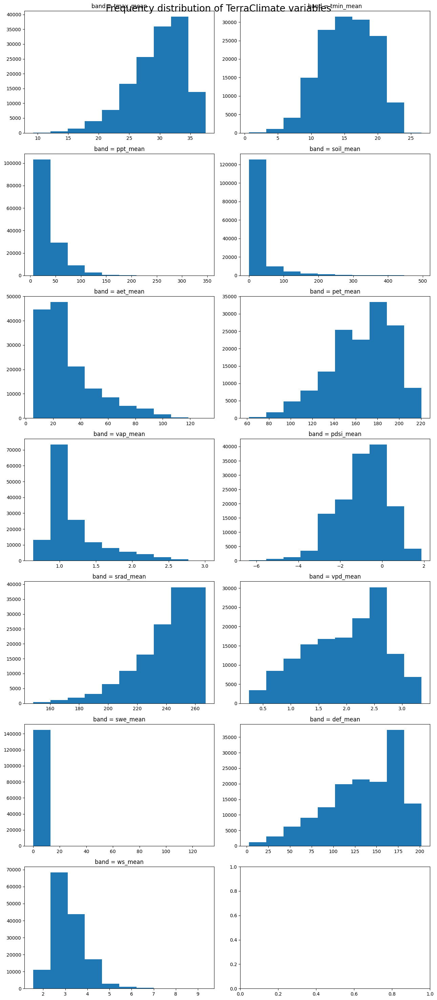

In [17]:
# bands = weather_data.band.values

# nrow = len(bands) // 2 + (len(bands) % 2)
# ncol = 2
# fig, ax = plt.subplots(nrow, ncol, figsize=(13, 30))


# for i in range(len(bands)):
#     xr.plot.hist(weather_data[i], ax=ax[i//ncol, i%ncol])

# fig.suptitle("Frequency distribution of TerraClimate variables",  fontsize=20)
# fig.tight_layout()

### Joining Pretictors to the Response Variable

Now that we have read in our predictor variables, we need to join them onto the response variable of frogs. To do this, we loop through the frog occurrence data and assign each frog occurrence the closest predictor pixel value from each of the predictor variables based on the geo-coordinates. The `sel` method of the xarray dataarray comes in handy here.

In [19]:
assets=['tmax', 'tmin', 'ppt', 'soil', 'aet', 'pet', 'vap', 'pdsi', 'srad', 'vpd', 'swe', 'def', 'ws']

weather_data = pd.read_csv('real_australia_full_train_data.csv')
weather_data = weather_data[assets]
weather_data

,tmax,tmin,ppt,soil,aet,pet,vap,pdsi,srad,vpd,swe,def,ws
0,22.300000,10.800000,28.3,13.400001,28.300001,93.000000,1.148,-5.10,131.60149,0.70,0.0,64.700005,4.10
1,20.500000,9.800000,86.2,116.900000,90.800000,98.200005,1.132,-2.80,200.59909,0.69,0.0,7.400000,3.80
2,28.199999,15.799999,153.2,38.000000,139.800000,139.800000,1.698,-4.50,251.40200,0.86,0.0,0.000000,3.10
3,24.800000,15.400000,75.6,32.000000,80.300000,142.800000,1.540,-3.70,246.70395,0.68,0.0,62.500000,4.05
4,28.900000,17.300000,78.3,22.300001,78.900000,175.800000,1.656,-3.70,270.40320,0.91,0.0,96.900000,3.64
...,...,...,...,...,...,...,...,...,...,...,...,...,...
63883,17.400000,6.900000,87.5,40.100002,98.200005,111.400000,0.901,-2.40,205.00401,0.52,0.0,13.200000,6.02
63884,17.199999,8.900000,59.4,3.800000,56.700000,73.600000,0.991,-5.50,88.80298,0.44,0.0,16.900000,5.51
63885,18.199999,7.800000,79.5,12.300000,79.500000,115.500000,0.960,-2.30,205.19815,0.55,0.0,36.000000,6.38
63886,18.300000,10.200000,56.2,2.200000,53.500000,78.800000,1.100,-5.40,88.00214,0.47,0.0,25.300001,6.35


In [44]:
def join_frogs(frogs, data):
    """Collects the data for each frog location and joins it onto the frog data 

    Arguments:
    frogs -- dataframe containing the response variable along with ["decimalLongitude", "decimalLatitude", "key"]
    data -- xarray dataarray of features, indexed with geocoordinates
    """
    combined_data = pd.concat([frogs, data], axis=1)
    combined_data = combined_data[list(weather_data.columns) + ['occurrenceStatus']]
    combined_data = combined_data.groupby(by=list(weather_data.columns), as_index=False).sum()
    combined_data['occurrenceStatus'] = 1 * (combined_data['occurrenceStatus'] >= 1)
    return combined_data
    
model_data = join_frogs(frog_data, weather_data)
model_data

,tmax,tmin,ppt,soil,aet,pet,vap,pdsi,srad,vpd,swe,def,ws,occurrenceStatus
0,6.600000,-0.5,139.3,174.1,33.100002,33.100002,0.535,-4.6,75.403656,0.16,0.7,0.00000,4.4,0
1,6.900000,-1.0,193.4,85.4,41.400000,41.400000,0.550,-3.0,102.900270,0.23,1.2,0.00000,6.3,0
2,6.900000,-1.0,197.9,87.6,40.800000,40.800000,0.551,-3.0,102.900270,0.23,1.2,0.00000,6.1,0
3,7.400000,0.4,128.8,69.8,49.300000,49.300000,0.610,-2.0,142.799220,0.22,0.4,0.00000,8.3,0
4,7.600000,-2.4,32.7,35.9,21.300001,21.300001,0.638,-4.1,94.698010,0.14,0.5,0.00000,2.9,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17435,40.100000,25.8,3.5,3.5,3.400000,279.300020,1.613,-1.5,310.398830,4.68,0.0,275.90000,3.7,0
17436,40.200000,26.8,109.5,20.4,105.300000,227.900010,2.707,-1.7,292.402920,4.48,0.0,122.60000,2.7,0
17437,41.100000,26.3,6.0,3.9,5.800000,249.100000,2.389,-4.2,307.398160,5.66,0.0,243.30000,3.0,0
17438,41.600000,25.3,45.5,0.2,43.200000,294.900000,1.663,-1.1,329.999900,5.68,0.0,251.70000,3.9,0


In [48]:
litoria_presence = model_data[model_data.occurrenceStatus == 1]
litoria_absence = model_data[model_data.occurrenceStatus == 0]


In [ ]:
sns.boxplot

In [64]:
for i, j in enumerate(assets):
    print(i, j)

0 tmax
1 tmin
2 ppt
3 soil
4 aet
5 pet
6 vap
7 pdsi
8 srad
9 vpd
10 swe
11 def
12 ws


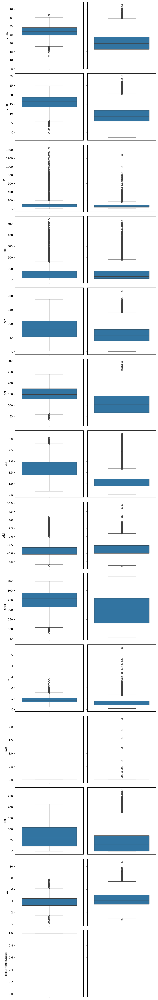

In [70]:
fig, ax = plt.subplots(len(litoria_absence.columns), 2, figsize=(8, 50), sharey='row')
for num, col in enumerate(litoria_absence.columns):
    sns.boxplot(litoria_presence[col], ax=ax[num, 0])
    sns.boxplot(litoria_absence[col], ax=ax[num, 1])

fig.tight_layout()

## Model Building

### Model Training

Now that we have the data in a format appropriate for machine learning, we can begin training a model. For this demonstration notebook, we will use a basic logistic regression model from the [scikit-learn](https://scikit-learn.org/stable/) library. This library offers a wide range of other models, each with the capacity for extensive parameter tuning and customisation capabilities.

Scikit-learn models require separation of predictor variables and the response variable. We store the predictor variables in dataframe `X` and the response in the array `y`. We must make sure to drop the response variable from `X`, otherwise the model will have the answers! It also doesn't make sense to use latitude and longitude as predictor variables in such a confined area, so we drop those too.

In [71]:
model_data.shape

(17440, 14)

In [72]:
j2 = model_data.isna()
non_nan_indices = np.where(j2.sum(axis=1) != 0)
# model_data.iloc[non_nan_indices, :]
model_data.iloc[non_nan_indices]

,tmax,tmin,ppt,soil,aet,pet,vap,pdsi,srad,vpd,swe,def,ws,occurrenceStatus


In [73]:
model_data.dropna(axis=0).shape

(17440, 14)

In [74]:
model_data.shape

(17440, 14)

In [75]:
features = assets

In [76]:
grouped = model_data.groupby(features, as_index=False).sum()
X = grouped[features]
y = 1 * (grouped['occurrenceStatus'] >= 1)

In [77]:
full_model = LogisticRegression()
# Separate the predictor variables from the response
# X = model_data.drop(columns={'gbifID', 'eventDate', 'decimalLatitude', 'decimalLongitude', 'species',
#        'country', 'continent', 'stateProvince', 'occurrenceStatus', 'key'})
# y = model_data.occurrenceStatus.astype(int)
# X
# Fit model
full_model.fit(X, y)

LogisticRegression()

### Model Prediction

#### Predict Training Set

Logistic regression is a machine learning model that estimates the probability of a binary response variable. In our case, the model will output the probability of a frog being present at a given location. To obtain the predictions for our training set, we simply use the `predict` method on our trained model. We will evaluate these predictions in the evaluation section of this notebook.

In [78]:
predictions = full_model.predict(X)

#### Predict Entire Region

For a species distribution model to be effective, it must also be capable of performing predictions over the entire region, not just the points in our training set. To do this, we will define another function called `predict_frogs` that will take our interpolated predictor variable image in, along with our logistic regression model, and output the probabilities for each pixel in the region. We will visualise these predictions in a heatmap in the results section of this notebook.

This function will be used later to predict the test regions for the challenge. 


In [73]:
from sklearn.preprocessing import MinMaxScaler
def predict_frogs(predictor_image, model, columns=None, normalize=False):
    """Returns a (1, n, m) xarray where each pixel value corresponds to the probability of a frog occurrence.
    
    Takes in the multi-band image outputted by the `create_predictor_image` function as well as the
    trained model and returns the predictions for each pixel value. Firstly, the $x$ and $y$ indexes
    in the predictor image are stacked into one multi-index $z=(x, y)$ to produce an $k\times n$
    array, which is the format required to feed into our logistic regression model. Then, the array
    is fed into the model, returning the model's predictions for the frog likelihood at each pixel. 
    The predicted probabilities are then indexed by the same multi-index $z$ as before, which allows 
    the array to be unstacked and returned as a one-band image, ready for plotting.

    Arguments:
    predictor_image -- (K, n, m) xarray, where K is the number of predictor variables.
    model -- sklearn model with K predictor variables.
    """
    # Stack up pixels so they are in the appropriate format for the model
    predictor_image = predictor_image.stack(z=("y", "x")).transpose()
    # Reorder variables to be in same order as model
    try:
        predictor_image = predictor_image.sel(band=model.feature_names_in_)
    except: 
        predictor_image = predictor_image.sel(band=columns)

    # Location of null values so that we can skip them (prediction model will break if nulls are present)
    null_pixels = (np.sum(predictor_image.isnull(), axis=-1) > 0)
    # Empty probabilities array
    probabilities = np.zeros((len(null_pixels), 2))
    # Calculate probability for each non-null pixel point
    if normalize:
        scalar = MinMaxScaler()
        probabilities[~null_pixels] = model.predict_proba(
            pd.DataFrame(scalar.fit_transform(predictor_image[~null_pixels]))
        )

    else:
        try:    
            probabilities[~null_pixels] = model.predict_proba(
                predictor_image[~null_pixels]
            )
        except: probabilities[~null_pixels] = np.array([1 - model.predict(predictor_image[~null_pixels]), model.predict(predictor_image[~null_pixels])]).T
    # Set null pixels to a probability of null
    probabilities[null_pixels] = np.array([np.nan, np.nan])
    # Just take probability of frog (class=1)
    probabilities = probabilities[:,1]
    # Add the coordinates to the probabilities, saving them in an xarray
    resultant_image = xr.DataArray(
        data=probabilities,
        dims=['z'],
        coords=dict(
            z=predictor_image.z
        )
    )
    # Unstack the image
    resultant_image = resultant_image.unstack()
    return resultant_image

# Calculate probability for each pixel point 
# resultant_image = predict_frogs(weather_data, full_model)

### Model Evaluation

Now that we have trained our model and made some predictions, all that is left is to evaluate it. We will do this by first visualising the output of the model with a probability heatmap. Then, we will evaluate both its in-sample and out-of-sample performance using the training set we have generated.

#### In-Sample Evaluation

In the last section, we made our predicitons for the training set and stored them in the `predictions` variable. We can now calculate some performance metrics to guage the effectiveness of the model. It must be stressed that this is the in-sample performance - the performance on the training set. Hence, the values will tend to overestimate its performance. Additionally, the training set itself is biased and this notebook only took naive approaches to address this. The model evaluation metrics are only as good as the data used to evaluate it, so the metrics themselves will also be biased. Thus, these metrics are NOT truly indicative of this model's performance. 

In this example, we will use `f1_score` and `accuracy_score` from Scikit-learn. Scikit-learn provides many other metrics that can be used for evaluation. You can even code your own if you think it will assist you in evaluating your model.


In [79]:
print(f"F1 Score: {np.mean(f1_score(y, predictions)).round(2)}")
print(f"Accuracy: {np.mean(accuracy_score(y, predictions)).round(2)}")

F1 Score: 0.66
Accuracy: 0.82


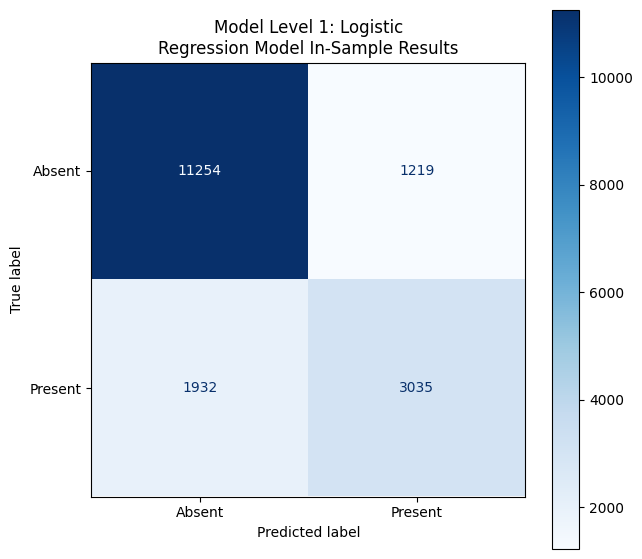

In [80]:
# Visualise the results in a confusion matrix
disp = ConfusionMatrixDisplay.from_estimator(full_model, X, y, display_labels=['Absent', 'Present'], cmap='Blues')
disp.figure_.set_size_inches((7, 7))
disp.ax_.set_title('Model Level 1: Logistic\nRegression Model In-Sample Results')
plt.show()

From above, we see that the model is able to achieve an ok F1 score and accuracy. From the confusion matrix, we can see that our model seems to confuse absent points with present points aka false positives, as shown in the top right corner. There may be many reasons for this, and a great way of understanding what might be causing the model's high false positive rate is to visualise its performance over the training region. We do this by plotting a probabilty heatmap in the section below.


#### Probability Heatmap

To create the probability heatmap, we write a function called `plot_heatmap`. This function will take in the model predictions from the entire region as stored in the `resultant_image` variable, and visualise these probabilities as a heatmap. In addition to the heatmap, we will also plot the actual map of the area in question, and the binary classification regions of the probability heatmap. The latter is simply a binary mask of the probability heatmap, 1 where the probability is greater than 0.5 and 0 elsewhere. 

To help visualise the effectiveness of our model, we plot the target species occurrences over top of each image. This can give us an idea of where our model is doing well, and where it is doing poorly. Particularly, we are interested in the high false positive rate.

In [32]:
def plot_heatmap(resultant_image, frog_data, title, crs = {'init':'epsg:4326'}):
    """Plots a real map, probability heatmap, and model classification regions for the probability image from our model.

    Arguments:
    resultant_image -- (1, n, m) xarray of probabilities output from the model
    frog_data -- Dataframe of frog occurrences, indicated with a 1 in the occurrenceStatus column. 
                 Must contain ["occurrenceStatus", "decimalLongitude", "decimalLatitude"]
    title -- string that will be displayed as the figure title
    crs -- coordinate reference system for plotting the real map. Defaults to EPSG:4326.
    """
    fig, ax = plt.subplots(1, 3, figsize = (20, 10), sharex=True, sharey=True)
    extent = [resultant_image.x.min(),resultant_image.x.max(),resultant_image.y.min(),resultant_image.y.max()]
    cmap = 'PiYG'

    # Plot real map
    ax[0].scatter(x=[extent[0], extent[1]], y=[extent[2], extent[3]], alpha=0)
    cx.add_basemap(ax[0], crs=crs)
    ax[0].set_title('Real map')
    
    # Plot heatmap from model
    heatmap = resultant_image.plot.imshow(
        x='x', y='y', ax=ax[1], cmap=cmap, vmin=0, vmax=1, interpolation='none', add_colorbar=False
    )
    ax[1].set_aspect('equal')
    ax[1].set_title('Model Probability Heatmap')

    # Plot binary classification from model
    regions = xr.where(resultant_image.isnull(), np.nan, resultant_image>0.5).plot.imshow(
            x='x', y='y', ax=ax[2], cmap=cmap, vmin=0, vmax=1, interpolation='none', add_colorbar=False
    )
    ax[2].set_aspect('equal')
    ax[2].set_title('Model Classification Regions')

    # Plot real frogs
    for i, axis in enumerate(ax):
        filt = frog_data.occurrenceStatus == 1
        axis.scatter(
            frog_data[filt].decimalLongitude, frog_data[filt].decimalLatitude, 
            color = 'dodgerblue', marker='.', alpha=0.5, label='Target Species' if i==0 else ''
        )

    fig.colorbar(heatmap, ax=ax, location = 'bottom', aspect=40)
    fig.legend(loc = (0.9, 0.9))
    fig.suptitle(title, x=0.5, y=0.9, fontsize=20)
    
plot_heatmap(resultant_image, frog_data, f"Logistic Regression Model Results - {region_name}")

NameError: name 'resultant_image' is not defined

From the plots above, we can see that the model does a pretty good job of mapping where litoria fallax is. However, our performance metrics before suggested otherwise. The main limitation of the evaluation metrics comes from the pseudo absence species, crinia signifera, sharing much of the same habitat as litoria fallax. This paired with the relatively coarse spatial resolution of TerraClimate makes distinguising close habitats difficult. This explains the high rate of false positives, as there are many frog absence points within the green classification region. 

There are many ways you might go about addressing this issue. Perhaps choosing a species that does not closely share the same habitat as litoria fallax. Alternatively, a greater variety of spatial sampling could also resolve this issue, i.e. picking extra regions where only litoria fallax exists and some where only other species exist. Another option is to abandon the pseudo-absence approach entirely and develop a unique way of sampling for absence points. Ultimately, you might think it is worthwhile improving the training set to make your evaluation metrics a little more representative of the SDM performance. 



#### Out-of-Sample Evaluation

When evaluating a machine learning model, it is essential to correctly and fairly evaluate the model's ability to generalise. This is because models have a tendancy to overfit the dataset they are trained on. To estimate the out-of-sample performance, we will use k-fold cross-validation. This technique involves splitting the training dataset into folds, in this case we will use 10. Each iteration, the model is trained on all but one of the folds, which is reserved for testing. This is repeated until all folds have been left out once. At the end of the process, we will have 10 metrics which can be averaged, giving a more reliable and valid measure of model performance. 

Scikit-learn has built-in functions that can assist in k-fold cross validation. In particular, we will use `StratifiedKFold` to split our data into folds, ensuring there is always a balanced number of frogs and non-frogs in each fold.

Again, these metrics are derived from a biased sample, so be careful what you infer.


In [81]:
cv_model = LogisticRegression()

n_folds = 10

skf = StratifiedKFold(n_splits=n_folds, random_state=420, shuffle=True)
metrics = {'F1': f1_score, 'Accuracy': accuracy_score}
results = {'predicted':[], 'actual':[]}
scores = {'F1': [], 'Accuracy': []}

for i, (train_index, test_index) in enumerate(skf.split(X, y)):
    # Split the dataset
    print(f"Fold {i+1} of {n_folds}")
    X_train, X_test = X.iloc[train_index, :], X.iloc[test_index, :]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Fit the model with the training set
    cv_model.fit(X_train, y_train)
    
    predictions = cv_model.predict(X_test)
    
    for metric, fn in metrics.items():
        scores[metric].append(fn(y_test, predictions))
        
    results['predicted'].extend(predictions)
    results['actual'].extend(list(y_test))
        
print(f'\nMetrics averaged over {n_folds} trials:')
for metric, result in scores.items():
    print(f"{metric}: {np.mean(result).round(2)}")
    

Fold 1 of 10
Fold 2 of 10
Fold 3 of 10
Fold 4 of 10
Fold 5 of 10
Fold 6 of 10
Fold 7 of 10
Fold 8 of 10
Fold 9 of 10
Fold 10 of 10

Metrics averaged over 10 trials:
F1: 0.66
Accuracy: 0.82


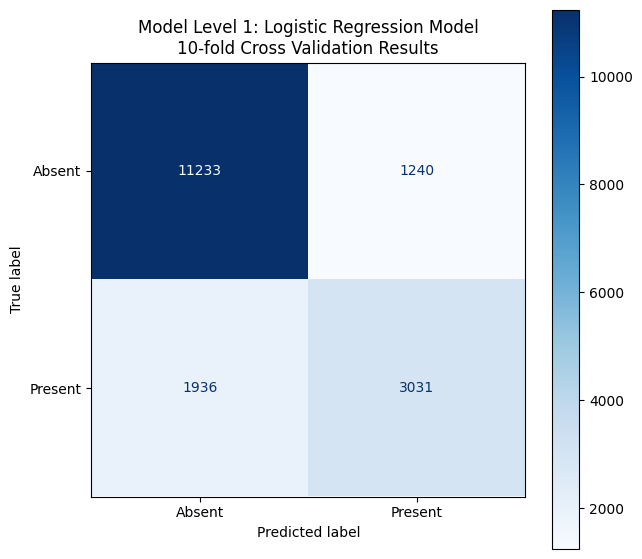

In [82]:
# Visualise the results in a confusion matrix
disp = ConfusionMatrixDisplay.from_predictions(results['actual'], results['predicted'], display_labels=['Absent', 'Present'], cmap='Blues')
disp.figure_.set_size_inches((7, 7))
disp.ax_.set_title('Model Level 1: Logistic Regression Model\n10-fold Cross Validation Results')
plt.show()

The results from the 10-fold cross validation are similar than the in-sample metrics. This is a good sign as it shows that we haven't overfit our model. We see similar behavour in the higher rate of false positives that we saw in the in-sample performance. 

In [31]:
X.shape

(37186, 13)

In [43]:
from sklearn.decomposition import PCA

pca = PCA(n_components=X.shape[1])
pca_fit_data = pd.DataFrame(pca.fit_transform(X))


In [44]:
pca_fit_data.shape

(63510, 13)

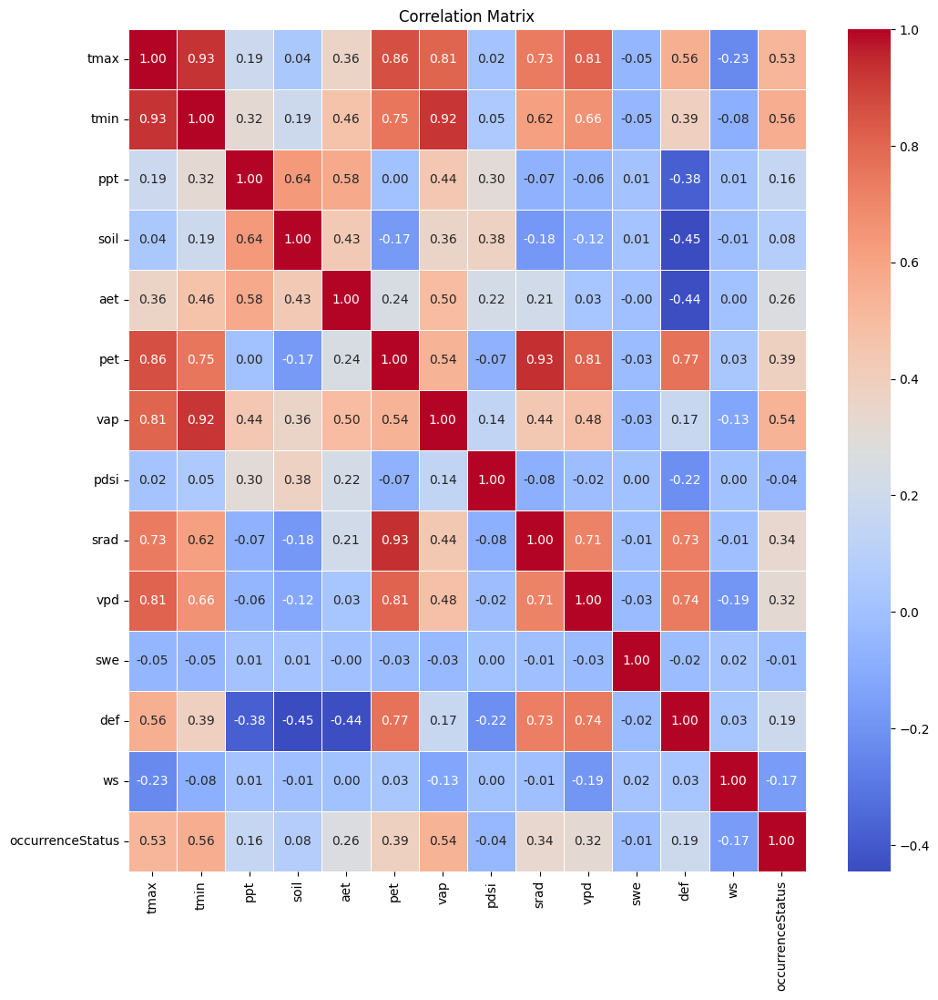

In [83]:
import seaborn as sns
correlation_matrix = pd.concat([X, y], axis=1).corr()
# Plotting the correlation matrix as a heatmap
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


In [85]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=False)

gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))

0.6578746177370031
0.7841813359054738


In [91]:
new_data_model = GaussianNB()

testing = cross_validate(new_data_model, X, y, cv=10, scoring=['accuracy', 'f1'])
print(testing['test_accuracy'].mean(), testing['test_f1'].mean())



0.7301605504587155 0.6777207485966009


In [89]:
from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)
clf = RandomForestClassifier()

clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))

0.9016628440366973
0.8234688625836336


In [90]:
clf2 = RandomForestClassifier()

testing = cross_validate(clf2, X, y, cv=10, scoring=['accuracy', 'f1'])
print(testing['test_accuracy'].mean(), testing['test_f1'].mean())


0.5861238532110092 0.2797030198412619


In [93]:

import lightgbm as lgb
parameters = {
    'application': 'binary',
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'boosting': 'gbdt',
    'num_leaves': 31,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.5,
    'bagging_freq': 20,
    'learning_rate': 0.05,
    'verbose': 0
}
n_folds = 10

skf = StratifiedKFold(n_splits=n_folds, random_state=420, shuffle=True)
metrics = {'F1': f1_score, 'Accuracy': accuracy_score}
results = {'predicted':[], 'actual':[]}
scores = {'F1': [], 'Accuracy': []}

for i, (train_index, test_index) in enumerate(skf.split(X, y)):
    # Split the dataset
    print(f"Fold {i+1} of {n_folds}")
    X_train, X_test = X.iloc[train_index, :], X.iloc[test_index, :]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Fit the model with the training set
    train_data = lgb.Dataset(X_train, label=y_train)
    cv_model = lgb.train(params=parameters, train_set=train_data)
    
    predictions = (cv_model.predict(X_test) >= 0.5) * 1
    
    for metric, fn in metrics.items():
        scores[metric].append(fn(y_test, predictions))
        
    results['predicted'].extend(predictions)
    results['actual'].extend(list(y_test))
        
print(f'\nMetrics averaged over {n_folds} trials:')
for metric, result in scores.items():
    print(f"{metric}: {np.mean(result).round(2)}")
    

Fold 1 of 10
Fold 2 of 10


Fold 3 of 10
Fold 4 of 10
Fold 5 of 10
Fold 6 of 10
Fold 7 of 10
Fold 8 of 10
Fold 9 of 10
Fold 10 of 10

Metrics averaged over 10 trials:
F1: 0.81
Accuracy: 0.88


In [94]:
from sklearn import svm
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True)

svm_clf = svm.SVC()

testing = cross_validate(svm_clf, X, y, cv=10, scoring=['accuracy', 'f1'])
print(testing['test_accuracy'].mean(), testing['test_f1'].mean())


0.7932912844036697 0.5958578105946233


In [95]:
from sklearn import svm
from sklearn.model_selection import cross_validate, train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True)

for i in range(1, 5):
    print(f"n: {i}")
    svm_clf = svm.SVC(kernel='poly', degree=i)
    # trial = cross_validate(svm_clf, X, y, scoring=['accuracy', 'f1'], cv=10)
    # print(trial['test_accuracy'].mean(), trial['test_f1'].mean())
    
    testing = cross_validate(svm_clf, X, y, cv=10, scoring=['accuracy', 'f1'])
    print(testing['test_accuracy'].mean(), testing['test_f1'].mean())


n: 1


0.7377866972477064 0.41471884921929336
n: 2
0.7913990825688073 0.5532415760049354
n: 3
0.8014334862385322 0.5767731192338031
n: 4
0.8025229357798164 0.5808036268045422
n: 5
0.8014334862385322 0.5722582729300882
n: 6
0.7961009174311926 0.5604527212851301
n: 7


KeyboardInterrupt: 

In [96]:
import tensorflow as tf
from tensorflow.keras import layers, models


# Define the model architecture
def create_model(input_shape, num_classes):
    model = models.Sequential([
        layers.Dense(64, activation='relu', input_shape=(input_shape,)),
        layers.Dropout(0.5),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Instantiate the model
input_shape = X_train.shape[1]  # Example input shape for tabular data
num_classes = 2  # Example number of classes
model = create_model(input_shape, num_classes)

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Print the model summary
print(model.summary())

# Train the model
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, shuffle=True)

X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=True)

history = model.fit(X_train, y_train, epochs=30, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model on test data
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test Loss: {loss}, Test Accuracy: {accuracy}')





Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                896       
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 64)                4160      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 2)                 130       
                                                                 
Total params: 5186 (20.26 KB)
Trainable params: 5186 (20.26 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
Epoch 1/30


4

In [99]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer
tree_clf = DecisionTreeClassifier()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True)

tree_model = cross_validate(tree_clf, X_train, y_train, scoring=['accuracy', 'f1'], cv=10)
print(testing['test_accuracy'].mean(), testing['test_f1'].mean())

tree_clf.fit(X_train, y_train)

0.7961009174311926 0.5604527212851301


DecisionTreeClassifier()

In [100]:
from sklearn import tree
plt.figure(figsize=(100,100))
tree.plot_tree(tree_clf)

[Text(0.503237428966068, 0.9833333333333333, 'x[6] <= 1.304\ngini = 0.41\nsamples = 12208\nvalue = [8693, 3515]'),
 Text(0.16791202145561632, 0.95, 'x[0] <= 20.37\ngini = 0.143\nsamples = 7768\nvalue = [7166, 602]'),
 Text(0.08124158603281448, 0.9166666666666666, 'x[2] <= 316.6\ngini = 0.039\nsamples = 4766\nvalue = [4672, 94]'),
 Text(0.05690260832982751, 0.8833333333333333, 'x[0] <= 18.355\ngini = 0.037\nsamples = 4759\nvalue = [4670, 89]'),
 Text(0.01145561632309634, 0.85, 'x[12] <= 1.42\ngini = 0.014\nsamples = 3483\nvalue = [3459, 24]'),
 Text(0.01037862852334876, 0.8166666666666667, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(0.01253260412284392, 0.8166666666666667, 'x[0] <= 16.805\ngini = 0.013\nsamples = 3482\nvalue = [3459, 23]'),
 Text(0.005384938998737905, 0.7833333333333333, 'x[4] <= 19.3\ngini = 0.003\nsamples = 2392\nvalue = [2389, 3]'),
 Text(0.003230963399242743, 0.75, 'x[2] <= 19.95\ngini = 0.044\nsamples = 88\nvalue = [86, 2]'),
 Text(0.002153975599495162, 0.716

In [103]:
entropy_clf = DecisionTreeClassifier(criterion='entropy')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True)

tree_entropy = cross_validate(entropy_clf, X_train, y_train, scoring=['accuracy', 'f1'], cv=10)

tree_model['test_accuracy'].mean(), tree_model['test_f1'].mean()

(0.8609109705831018, 0.7574832075007053)

[Text(0.489714673647691, 0.984375, 'x[6] <= 1.28\nentropy = 0.86\nsamples = 12208\nvalue = [8753, 3455]'),
 Text(0.1448950823605562, 0.953125, 'x[0] <= 19.835\nentropy = 0.371\nsamples = 7645\nvalue = [7100, 545]'),
 Text(0.044885387139254065, 0.921875, 'x[0] <= 18.18\nentropy = 0.103\nsamples = 4509\nvalue = [4448, 61]'),
 Text(0.017498828203468517, 0.890625, 'x[12] <= 3.015\nentropy = 0.041\nsamples = 3397\nvalue = [3382, 15]'),
 Text(0.009999330401982011, 0.859375, 'x[9] <= 0.385\nentropy = 0.148\nsamples = 471\nvalue = [461, 10]'),
 Text(0.008570854630270294, 0.828125, 'entropy = 0.0\nsamples = 219\nvalue = [219, 0]'),
 Text(0.011427806173693726, 0.828125, 'x[12] <= 1.42\nentropy = 0.241\nsamples = 252\nvalue = [242, 10]'),
 Text(0.009999330401982011, 0.796875, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(0.012856281945405442, 0.796875, 'x[12] <= 3.005\nentropy = 0.223\nsamples = 251\nvalue = [242, 9]'),
 Text(0.011427806173693726, 0.765625, 'x[1] <= -0.15\nentropy = 0.204\

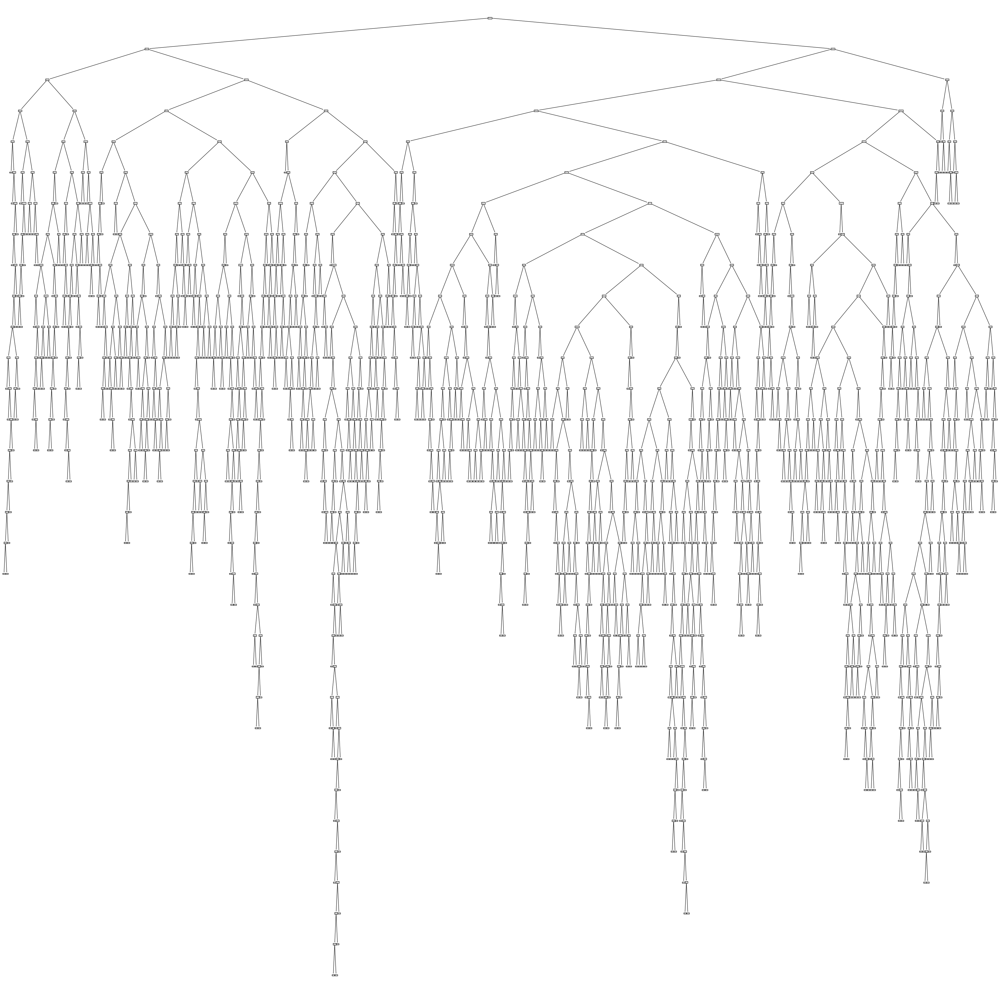

In [104]:
plt.figure(figsize=(50,50))
entropy_clf.fit(X_train, y_train)
tree.plot_tree(entropy_clf)

Train Accuracy: 98.88%
Test Accuracy: 70.22%


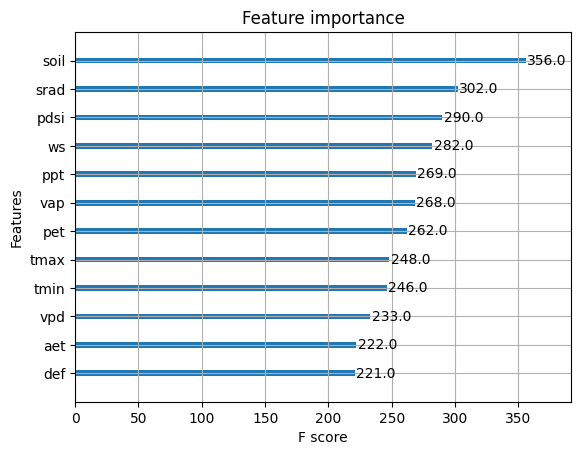

In [105]:
from xgboost import XGBClassifier, plot_importance
from sklearn.model_selection import train_test_split
model = XGBClassifier()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=False)
model.fit(X_train, y_train)

# make predictions for test data
y_pred = model.predict(X_test)
# predictions = [round(value) for value in y_pred]

# evaluate predictions with train and test data
accuracy = accuracy_score(y_train, model.predict(X_train))
print("Train Accuracy: %.2f%%" % (accuracy * 100.0))
accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy: %.2f%%" % (accuracy * 100.0))

# plot the feature importance
plot_importance(model)
plt.show()

In [81]:
import copy
new_data = copy.copy(X)

In [62]:
old_columns = X.columns
old_columns

Index(['aet_mean', 'def_mean', 'pdsi_mean', 'pet_mean', 'ppt_mean',
       'soil_mean', 'srad_mean', 'swe_mean', 'tmax_mean', 'tmin_mean',
       'vap_mean', 'vpd_mean', 'ws_mean'],
      dtype='object')

In [82]:
temp_avg = (new_data['tmax_mean'] + new_data['tmin_mean']) / 2
new_data['moisture'] = temp_avg * new_data['ppt_mean']
new_data['water_balance'] = new_data['ppt_mean'] - 0.5 * (new_data['aet_mean'] + new_data['pet_mean'])
new_data['HSI'] = (temp_avg + new_data['ppt_mean'] + new_data['soil_mean']) / 3
new_data['DSI'] = new_data['ppt_mean'] / (1 + np.abs(new_data['pdsi_mean']))
new_data['TCI'] = temp_avg * new_data['vap_mean']
new_data['temp_avg'] = temp_avg

In [83]:
new_columns = list(set(new_data.columns) - set(X.columns))

In [84]:
new_columns

['HSI', 'moisture', 'water_balance', 'temp_avg', 'TCI', 'DSI']

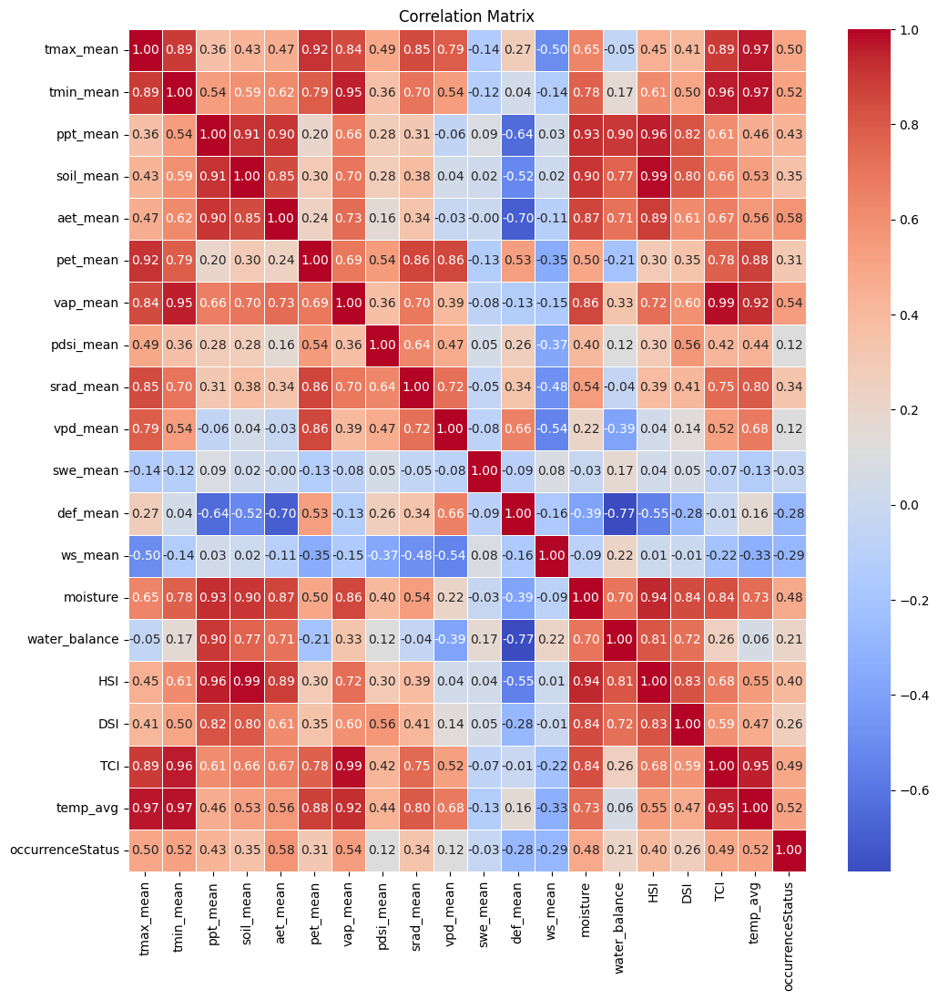

In [85]:
import seaborn as sns
correlation_matrix = pd.concat([new_data, y], axis=1).corr()
# Plotting the correlation matrix as a heatmap
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


In [86]:
new_data[new_columns]

,HSI,moisture,water_balance,temp_avg,TCI,DSI
0,75.682751,690.989963,81.184999,4.958250,3.155926,50.298966
1,77.947056,726.197943,80.031666,5.197833,3.330425,50.918424
2,68.335722,784.602369,64.169166,6.140500,4.201126,43.906421
3,53.921945,739.812139,39.290832,7.100833,5.085854,19.563735
4,70.627029,574.655384,19.786666,6.991083,5.119803,14.302410
...,...,...,...,...,...,...
3221,51.945056,1863.021529,-52.546669,28.396833,51.208010,57.999116
3222,50.783306,1835.453123,-51.456669,28.751583,50.987580,42.502220
3223,69.352750,2183.084221,-43.767502,28.246583,55.649066,67.666715
3224,48.878000,1786.901755,-52.670002,28.870666,51.463408,40.661339


In [ ]:
for cols in new_data.columns:
    

In [90]:
from sklearn.svm import SVC
from sklearn.model_selection import cross_validate
cv_model = SVC()
testing = cross_validate(cv_model, new_data[new_columns], y, scoring=['accuracy', 'f1'])
testing['test_accuracy'].mean(), testing['test_f1'].mean()

(0.8267429860561115, 0.743115714725088)

In [67]:
high_corr = list(correlation_matrix['occurrenceStatus'].sort_values(ascending=False)[1:9].index)

In [68]:
def Strt_fold_log_reg(new_data, y, n_folds=10):
    new_data_model = LogisticRegression()

    skf = StratifiedKFold(n_splits=n_folds, random_state=420, shuffle=True)
    metrics = {'F1': f1_score, 'Accuracy': accuracy_score}
    results = {'predicted':[], 'actual':[]}
    scores = {'F1': [], 'Accuracy': []}

    for i, (train_index, test_index) in enumerate(skf.split(X, y)):
        # Split the dataset
        print(f"Fold {i+1} of {n_folds}")
        X_train, X_test = new_data.iloc[train_index, :], new_data.iloc[test_index, :]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        # Fit the model with the training set
        new_data_model.fit(X_train, y_train)
        
        predictions = new_data_model.predict(X_test)
        
        for metric, fn in metrics.items():
            scores[metric].append(fn(y_test, predictions))
            
        results['predicted'].extend(predictions)
        results['actual'].extend(list(y_test))
            
    print(f'\nMetrics averaged over {n_folds} trials:')
    for metric, result in scores.items():
        print(f"{metric}: {np.mean(result).round(2)}")
    return results
        

In [69]:
Strt_fold_log_reg(new_data[high_corr], y, 10)

Fold 1 of 10
Fold 2 of 10
Fold 3 of 10
Fold 4 of 10
Fold 5 of 10
Fold 6 of 10
Fold 7 of 10
Fold 8 of 10
Fold 9 of 10
Fold 10 of 10

Metrics averaged over 10 trials:
F1: 0.79
Accuracy: 0.77


{'predicted': [0,
  0,
  1,
  0,
  1,
  0,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  1,
  1,
  0,
  0,
  1,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  0,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  1,
  1,
  1,
  0,
  0,
  1,
  0,
  1,
  0,
  1,
  1,
  1,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  1,
  0,
  1,
  0,
  1,
  0,
  0,
  0,
  0,
  1,
  1,
  0,
  0,
  1,
  0,
  1,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  1,
  0,
  1,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  0,
  1,
  1,
  0,
  0,
  1,
  0,
  1,
  0,
  0,
  0,
  1,
  0,
  1,
  0,
  0,
  1,
  1,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  0,
  

In [70]:
entropy_clf = DecisionTreeClassifier(criterion='entropy')
X_train, X_test, y_train, y_test = train_test_split(new_data, y, test_size=0.3, shuffle=True)

tree_entropy = cross_validate(entropy_clf, X_train, y_train, scoring=['accuracy', 'f1'], cv=10)
# print(f"Accuracy scores: {scores['test_accuracy']}")
# print(f"F1 scores: {scores['test_f1']}")
tree_model['test_accuracy'].mean(), tree_model['test_f1'].mean()

(0.8510564733000384, 0.8579516488226833)

0.8519182502689135
0.8591164932628347


[Text(0.4644512494613838, 0.9827586206896551, 'x[13] <= 1264.453\nentropy = 1.0\nsamples = 26030\nvalue = [12970, 13060]'),
 Text(0.2167831958579558, 0.9482758620689655, 'x[12] <= 3.546\nentropy = 0.638\nsamples = 10266\nvalue = [8609, 1657]'),
 Text(0.11329663903479974, 0.9137931034482759, 'x[10] <= 1.044\nentropy = 0.897\nsamples = 4774\nvalue = [3276.0, 1498.0]'),
 Text(0.041146859268986646, 0.8793103448275862, 'x[6] <= 203.773\nentropy = 0.301\nsamples = 2112\nvalue = [1999, 113]'),
 Text(0.018822499452834318, 0.8448275862068966, 'x[9] <= 7.784\nentropy = 0.131\nsamples = 1815\nvalue = [1782, 33]'),
 Text(0.009630115999124535, 0.8103448275862069, 'x[6] <= 200.84\nentropy = 0.046\nsamples = 1185\nvalue = [1179, 6]'),
 Text(0.0035018603633180127, 0.7758620689655172, 'x[5] <= 76.584\nentropy = 0.012\nsamples = 904\nvalue = [903, 1]'),
 Text(0.0017509301816590063, 0.7413793103448276, 'entropy = 0.0\nsamples = 888\nvalue = [888, 0]'),
 Text(0.005252790544977019, 0.7413793103448276, 'x[1

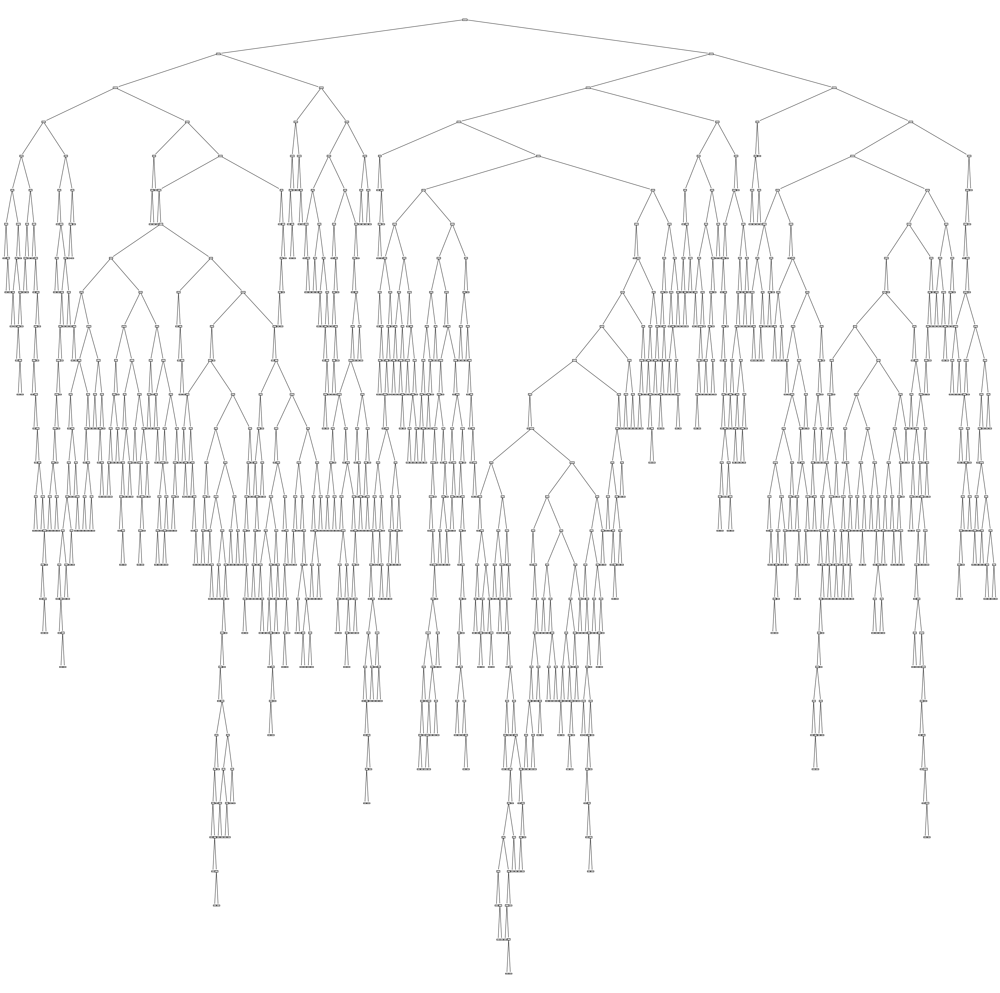

In [71]:
entropy_clf.fit(X_train, y_train)
y_pred = entropy_clf.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_pred=y_pred, y_true=y_test))
plt.figure(figsize=(50,50))
tree.plot_tree(entropy_clf)

Train Accuracy: 87.46%
Test Accuracy: 53.95%


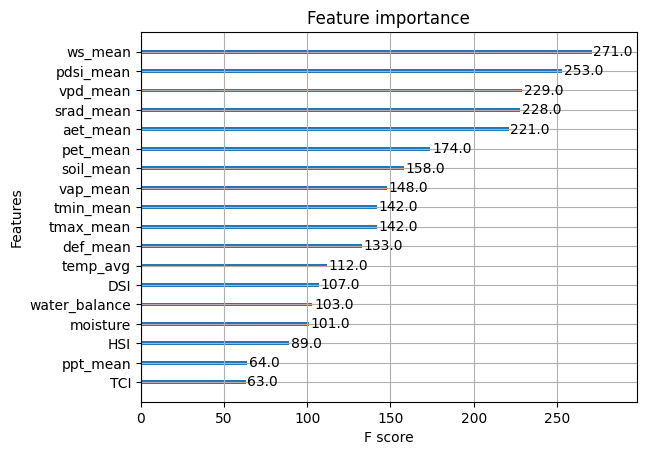

In [72]:
from xgboost import XGBClassifier, plot_importance
from sklearn.model_selection import train_test_split
model = XGBClassifier()
X_train, X_test, y_train, y_test = train_test_split(new_data, y, test_size=0.3, shuffle=False)
model.fit(X_train, y_train)

# make predictions for test data
y_pred = model.predict(X_test)
# predictions = [round(value) for value in y_pred]

# evaluate predictions with train and test data
accuracy = accuracy_score(y_train, model.predict(X_train))
print("Train Accuracy: %.2f%%" % (accuracy * 100.0))
accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy: %.2f%%" % (accuracy * 100.0))

# plot the feature importance
plot_importance(model)
plt.show()

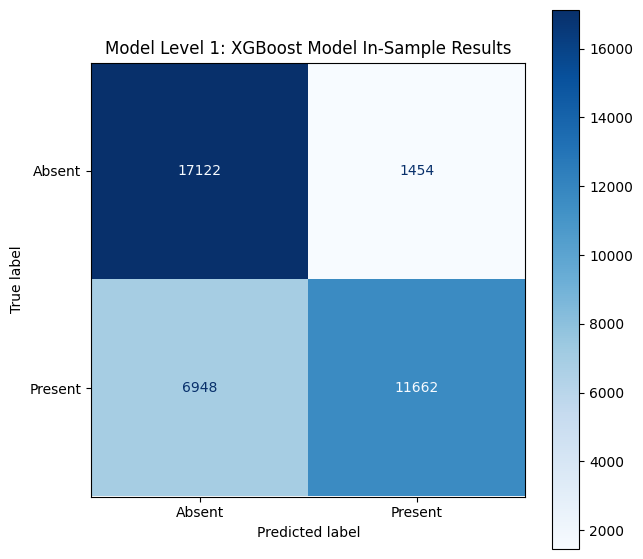

In [73]:
# Visualise the results in a confusion matrix
disp = ConfusionMatrixDisplay.from_estimator(model, new_data, y, display_labels=['Absent', 'Present'], cmap='Blues')
disp.figure_.set_size_inches((7, 7))
disp.ax_.set_title('Model Level 1: XGBoost Model In-Sample Results')
plt.show()

In [74]:
new2 = copy.copy(new_data)
new2 = pd.concat([new2, model_data[['decimalLatitude', 'decimalLongitude']]], axis=1)
new2

,aet_mean,def_mean,pdsi_mean,pet_mean,ppt_mean,soil_mean,srad_mean,swe_mean,tmax_mean,tmin_mean,...,vpd_mean,ws_mean,moisture,water_balance,HSI,DSI,TCI,temp_avg,decimalLatitude,decimalLongitude
0,74.426668,48.088334,-3.064500,122.515002,78.956667,86.060001,202.539550,0.0,24.752166,13.260166,...,0.768167,3.858167,1500.663536,-19.514168,61.340945,19.425924,27.920693,19.006166,-32.136533,152.345153
1,62.705001,31.915001,-2.959667,94.620002,70.815000,61.070002,197.531135,0.0,17.464500,6.493000,...,0.505833,3.512667,848.275165,-7.847501,47.954584,17.884081,11.636358,11.978750,-33.376231,150.185438
2,80.930002,35.593334,-2.679667,116.523334,88.481667,93.835002,194.666467,0.0,23.087500,12.855000,...,0.705000,4.115000,1590.126119,-10.245001,66.762639,24.046110,24.692199,17.971250,-34.496490,150.762660
3,49.046668,56.860001,-2.267333,105.906668,51.491667,38.143334,197.398818,0.0,21.126666,8.092833,...,0.707500,2.945333,752.280361,-25.985001,34.748250,15.759539,15.430331,14.609750,-34.466653,150.010261
4,47.598334,92.445002,-2.996500,140.043336,52.176667,58.045001,232.393621,0.0,24.345166,13.365333,...,1.016000,4.695167,983.804072,-41.644168,43.025639,13.055590,25.509897,18.855250,-31.935800,115.886000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37397,80.926668,32.493334,-2.725833,113.420002,88.605000,128.325001,194.388579,0.0,22.368500,13.190500,...,0.659000,4.104167,1575.352570,-8.568335,78.236500,23.781258,24.352582,17.779500,-34.924979,150.647032
37398,78.620002,39.131667,-2.494167,117.751669,89.018333,81.860001,195.746791,0.0,23.062499,13.867833,...,0.688333,4.484833,1643.738324,-9.167502,63.114500,25.476270,26.595072,18.465166,-34.028797,151.225626
37399,90.728335,27.193334,-3.355500,117.921669,113.293333,141.200001,210.919648,0.0,24.605499,13.768000,...,0.750500,3.474000,2173.730814,8.968331,91.226695,26.011557,30.011915,19.186750,-26.754987,152.839291
37400,83.956669,31.303334,-2.706667,115.260002,93.385000,117.718335,194.086769,0.0,22.557833,13.278000,...,0.667167,4.263833,1673.264611,-6.223335,76.340417,25.193795,24.673868,17.917916,-34.791600,150.779300


In [75]:
results = Strt_fold_log_reg(new2, y)

Fold 1 of 10
Fold 2 of 10
Fold 3 of 10
Fold 4 of 10
Fold 5 of 10
Fold 6 of 10


Fold 7 of 10
Fold 8 of 10
Fold 9 of 10
Fold 10 of 10

Metrics averaged over 10 trials:
F1: 0.82
Accuracy: 0.8


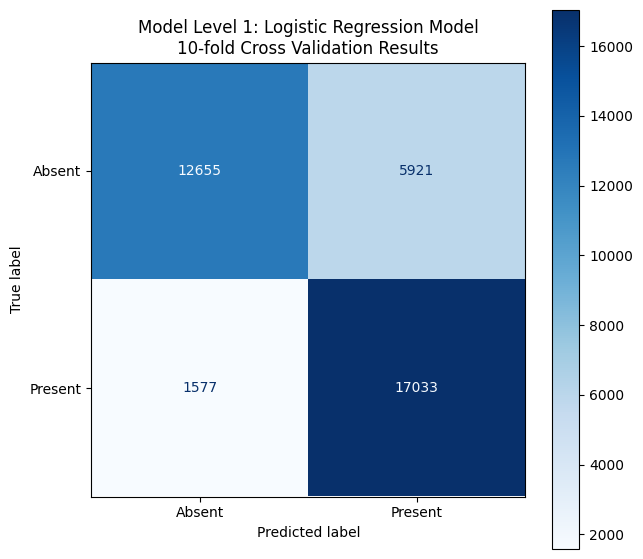

In [76]:
# Visualise the results in a confusion matrix
disp = ConfusionMatrixDisplay.from_predictions(results['actual'], results['predicted'], display_labels=['Absent', 'Present'], cmap='Blues')
disp.figure_.set_size_inches((7, 7))
disp.ax_.set_title('Model Level 1: Logistic Regression Model\n10-fold Cross Validation Results')
plt.show()

In [88]:
from sklearn.preprocessing import MinMaxScaler
import copy

X2 = copy.copy(X)

scaler = MinMaxScaler()

normalized_data = scaler.fit_transform(X2)
normalized_data = pd.DataFrame(normalized_data, columns=X2.columns)
normalized_data

,aet_mean,def_mean,pdsi_mean,pet_mean,ppt_mean,soil_mean,srad_mean,swe_mean,tmax_mean,tmin_mean,vap_mean,vpd_mean,ws_mean
0,0.553635,0.244129,0.431159,0.443719,0.216890,0.181212,0.441832,0.0,0.578304,0.566174,0.392226,0.189779,0.319815
1,0.442230,0.150038,0.444888,0.240359,0.188365,0.128531,0.397993,0.0,0.305915,0.262661,0.157787,0.089607,0.268895
2,0.615444,0.171437,0.481557,0.400039,0.250261,0.197602,0.372918,0.0,0.516084,0.548002,0.347446,0.165659,0.357667
3,0.312419,0.295160,0.535555,0.322641,0.120664,0.080199,0.396835,0.0,0.442795,0.334415,0.197715,0.166614,0.185282
4,0.298654,0.502182,0.440065,0.571505,0.123064,0.122154,0.703145,0.0,0.563092,0.570890,0.337529,0.284414,0.443173
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37181,0.615413,0.153402,0.475511,0.377415,0.250693,0.270311,0.370486,0.0,0.489211,0.563049,0.345428,0.148094,0.356071
37182,0.593490,0.192022,0.505849,0.408994,0.252142,0.172358,0.382374,0.0,0.515150,0.593428,0.378682,0.159295,0.412174
37183,0.708570,0.122569,0.393050,0.410233,0.337191,0.297452,0.515183,0.0,0.572822,0.588950,0.437062,0.183033,0.263197
37184,0.644210,0.146479,0.478021,0.390829,0.267441,0.247951,0.367844,0.0,0.496287,0.566973,0.348891,0.151212,0.379603


In [91]:
X.columns

Index(['aet_mean', 'def_mean', 'pdsi_mean', 'pet_mean', 'ppt_mean',
       'soil_mean', 'srad_mean', 'swe_mean', 'tmax_mean', 'tmin_mean',
       'vap_mean', 'vpd_mean', 'ws_mean'],
      dtype='object')

In [89]:
from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(normalized_data, y, test_size=0.3, shuffle=True)
clf = RandomForestClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))

0.8521871638580136
0.860996375284498


In [90]:
from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(pca_fit_data, y, test_size=0.3, shuffle=True)
clf = RandomForestClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))

0.8563105055575475
0.8652374947456914


In [107]:
from sklearn.neighbors import KNeighborsClassifier
X_train, X_test, y_train, y_test = train_test_split(normalized_data, y, test_size=0.3, shuffle=True)

for n in range(2, 20):
    neigh = KNeighborsClassifier(n_neighbors=n)
    neigh.fit(X_train, y_train)
    y_pred = neigh.predict(X_test)
    print(f"n = {n}")
    print(f"Accuracy: {accuracy_score(y_pred=y_pred, y_true=y_test)}")
    print(f"F1: {f1_score(y_true=y_test, y_pred=y_pred)}")

n = 2
Accuracy: 0.7171925421297957
F1: 0.6494833907343629
n = 3
Accuracy: 0.8217999282897096
F1: 0.8263755458515284
n = 4
Accuracy: 0.8193797059878093
F1: 0.8167348794906776
n = 5
Accuracy: 0.8386518465399785
F1: 0.8447740600206968
n = 6
Accuracy: 0.8233237719612765
F1: 0.8220637356685023
n = 7
Accuracy: 0.8404446038006453
F1: 0.8488964346349746
n = 8
Accuracy: 0.8357834349229114
F1: 0.8390723822909346
n = 9
Accuracy: 0.8434026532807458
F1: 0.8500042929509745
n = 10
Accuracy: 0.8341699533883112
F1: 0.8372624912033779
n = 11
Accuracy: 0.8419684474722122
F1: 0.8504791790348571
n = 12
Accuracy: 0.8397275008963786
F1: 0.846180316586373
n = 13
Accuracy: 0.8434026532807458
F1: 0.8517103811221458
n = 14
Accuracy: 0.8441197561850126
F1: 0.8498921018558481
n = 15
Accuracy: 0.844747221226246
F1: 0.8524953159598024
n = 16
Accuracy: 0.8425959125134457
F1: 0.8492962581531067
n = 17
Accuracy: 0.8452850484044461
F1: 0.8541244083840432
n = 18
Accuracy: 0.8434922911437791
F1: 0.8507692307692307
n = 19


In [105]:
from sklearn.neighbors import KNeighborsClassifier
X_train, X_test, y_train, y_test = train_test_split(pca_fit_data, y, test_size=0.3, shuffle=True)

neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(X_train, y_train)
y_pred = neigh.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))

0.79930082466834
0.7985605038236617


In [106]:
from sklearn.neighbors import KNeighborsClassifier
X_train, X_test, y_train, y_test = train_test_split(normalized_data, y, test_size=0.3, shuffle=True)

neigh2 = KNeighborsClassifier(n_neighbors=5)
neigh2.fit(X_train, y_train)
y_pred = neigh2.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))

0.8335424883470778
0.8421589460263493


In [111]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier, StackingClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(normalized_data, y, test_size=0.2, shuffle=True)

# Create the sub models
estimators = []
model1 = LogisticRegression()
estimators.append(('logistic', model1))
model2 = GaussianNB()
estimators.append(('naive_bayes', model2))
model3 = SVC()
estimators.append(('svm', model3))

# Create the ensemble model
ensemble = StackingClassifier(estimators)
ensemble.fit(X_train, y_train)
y_pred = ensemble.predict(X_test)

print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))


0.7960473245496101
0.8207067722491431


In [114]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier, StackingClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(normalized_data, y, test_size=0.2, shuffle=True)

# Create the sub models
estimators = [
    ('RF', RandomForestClassifier()),
    ('DT.E', DecisionTreeClassifier(criterion='entropy')),
    ('SVM', SVC()),
    # ('LR', LogisticRegression()),
    ('GB', GaussianNB())
]
# model1 = LogisticRegression()
# estimators.append(('logistic', model1))
# model2 = GaussianNB()
# estimators.append(('naive_bayes', model2))
# model3 = SVC()
# estimators.append(('svm', model3))

# Create the ensemble model
ensemble = StackingClassifier(estimators)
ensemble.fit(X_train, y_train)
y_pred = ensemble.predict(X_test)

print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))


0.8517074482387739
0.8617967673223906


In [115]:
normalized_data.columns

Index(['aet_mean', 'def_mean', 'pdsi_mean', 'pet_mean', 'ppt_mean',
       'soil_mean', 'srad_mean', 'swe_mean', 'tmax_mean', 'tmin_mean',
       'vap_mean', 'vpd_mean', 'ws_mean'],
      dtype='object')

In [117]:
features=['tmax_mean', 'tmin_mean', 'ppt_mean', 'soil_mean', 'aet_mean', 'vap_mean']

from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(normalized_data[features], y, test_size=0.3, shuffle=True)
clf = RandomForestClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))

0.8505736823234135
0.858500976148035


In [120]:
features=['tmax_mean', 'tmin_mean', 'ppt_mean', 'soil_mean', 'aet_mean', 'vap_mean', 'pdsi_mean']
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier, StackingClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(normalized_data[features], y, test_size=0.2, shuffle=True)

# Create the sub models
estimators = [
    ('RF', RandomForestClassifier()),
    ('DT.E', DecisionTreeClassifier(criterion='entropy')),
    ('SVM', SVC()),
    # ('LR', LogisticRegression()),
    ('GB', GaussianNB())
]
# model1 = LogisticRegression()
# estimators.append(('logistic', model1))
# model2 = GaussianNB()
# estimators.append(('naive_bayes', model2))
# model3 = SVC()
# estimators.append(('svm', model3))

# Create the ensemble model
ensemble = StackingClassifier(estimators)
ensemble.fit(X_train, y_train)
y_pred = ensemble.predict(X_test)

print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))


0.8556063457918796
0.8649396378269618


In [122]:
from sklearn.linear_model import SGDClassifier
X_train, X_test, y_train, y_test = train_test_split(normalized_data, y, test_size=0.3, shuffle=True)
clf = SGDClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))

0.7812836141986375
0.8121053442168489


In [80]:
from sklearn import svm
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)

# Create a Support Vector Classifier with a Radial basis function (RBF) kernel
clf = svm.SVC(kernel='rbf')
testing = cross_validate(clf, X, y, cv=10, scoring=['accuracy', 'f1'])
print(testing['test_accuracy'].mean(), testing['test_f1'].mean())

# Train the model (replace X_train and y_train with your data)
clf.fit(X_train, y_train)

# Predict the labels of the test set
y_pred = clf.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))

0.8573466915370267 0.7855734084606558
0.868421052631579
0.8009367681498829


In [124]:
from sklearn import svm
X_train, X_test, y_train, y_test = train_test_split(normalized_data[features], y, test_size=0.3, shuffle=True)

# Create a Support Vector Classifier with a Radial basis function (RBF) kernel
clf = svm.SVC(kernel='rbf')

# Train the model (replace X_train and y_train with your data)
clf.fit(X_train, y_train)

# Predict the labels of the test set
y_pred = clf.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))

0.8035138042309071
0.8307074451652765


array([[<Axes: title={'center': 'aet_mean'}>,
        <Axes: title={'center': 'def_mean'}>,
        <Axes: title={'center': 'pdsi_mean'}>,
        <Axes: title={'center': 'pet_mean'}>],
       [<Axes: title={'center': 'ppt_mean'}>,
        <Axes: title={'center': 'soil_mean'}>,
        <Axes: title={'center': 'srad_mean'}>,
        <Axes: title={'center': 'swe_mean'}>],
       [<Axes: title={'center': 'tmax_mean'}>,
        <Axes: title={'center': 'tmin_mean'}>,
        <Axes: title={'center': 'vap_mean'}>,
        <Axes: title={'center': 'vpd_mean'}>],
       [<Axes: title={'center': 'ws_mean'}>, <Axes: >, <Axes: >,
        <Axes: >]], dtype=object)

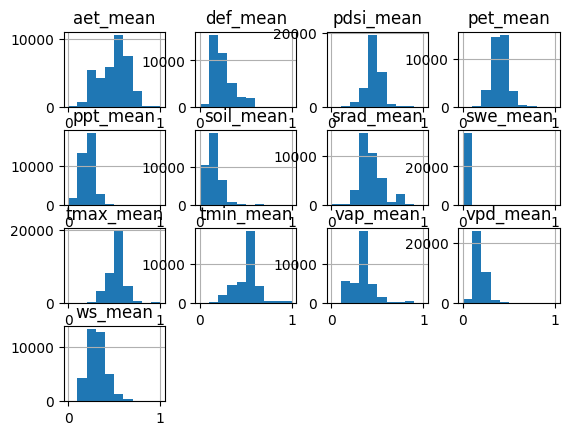

In [125]:
normalized_data.hist()

In [129]:
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(normalized_data, y, 
                                                    test_size=0.3)

# Create a Support Vector Classifier with a polynomial kernel
clf = svm.SVC(kernel='poly', degree=4)

# Train the model (replace X_train and y_train with your data)
clf.fit(X_train, y_train)

# Predict the labels of the test set
y_pred = clf.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))


0.8113122983148082
0.8373135481876497


In [127]:
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification

# Split the dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(normalized_data[features], y, 
                                                    test_size=0.3)

# Create a Support Vector Classifier with a polynomial kernel
clf = svm.SVC(kernel='poly', degree=2)

# Train the model (replace X_train and y_train with your data)
clf.fit(X_train, y_train)

# Predict the labels of the test set
y_pred = clf.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))


0.7953567586948728
0.8206175846625284


In [143]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

X_train, X_test, y_train, y_test = train_test_split(normalized_data, y, test_size=0.3, shuffle=True)

# Initialize RandomForestClassifier
clf = RandomForestClassifier()
clf.fit(X, y)

# Get the depth of each tree
tree_depths = [estimator.tree_.max_depth for estimator in clf.estimators_]

# Print the depth of each tree
for i, depth in enumerate(tree_depths):
    print(f"Tree {i} depth: {depth}")


Tree 0 depth: 27
Tree 1 depth: 29
Tree 2 depth: 27
Tree 3 depth: 27
Tree 4 depth: 23
Tree 5 depth: 24
Tree 6 depth: 25
Tree 7 depth: 24
Tree 8 depth: 27
Tree 9 depth: 25
Tree 10 depth: 29
Tree 11 depth: 25
Tree 12 depth: 25
Tree 13 depth: 22
Tree 14 depth: 23
Tree 15 depth: 24
Tree 16 depth: 20
Tree 17 depth: 25
Tree 18 depth: 27
Tree 19 depth: 27
Tree 20 depth: 23
Tree 21 depth: 22
Tree 22 depth: 25
Tree 23 depth: 30
Tree 24 depth: 28
Tree 25 depth: 23
Tree 26 depth: 25
Tree 27 depth: 26
Tree 28 depth: 24
Tree 29 depth: 26
Tree 30 depth: 22
Tree 31 depth: 35
Tree 32 depth: 28
Tree 33 depth: 29
Tree 34 depth: 27
Tree 35 depth: 23
Tree 36 depth: 28
Tree 37 depth: 25
Tree 38 depth: 25
Tree 39 depth: 25
Tree 40 depth: 26
Tree 41 depth: 25
Tree 42 depth: 31
Tree 43 depth: 26
Tree 44 depth: 25
Tree 45 depth: 26
Tree 46 depth: 29
Tree 47 depth: 22
Tree 48 depth: 21
Tree 49 depth: 32
Tree 50 depth: 27
Tree 51 depth: 28
Tree 52 depth: 27
Tree 53 depth: 23
Tree 54 depth: 28
Tree 55 depth: 27
Tr

In [159]:
features=['tmax_mean', 'tmin_mean', 'ppt_mean', 'soil_mean', 'aet_mean', 'vap_mean', 'pdsi_mean']

from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(normalized_data, y, test_size=0.3, shuffle=True)
clf = RandomForestClassifier(n_estimators=100, max_depth=10, 
                                   min_samples_split=5, min_samples_leaf=4, random_state=0)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(accuracy_score(y_pred=y_pred, y_true=y_test))
print(f1_score(y_true=y_test, y_pred=y_pred))

0.8462710648978128
0.8570952420631615


In [145]:
tree_depths = [estimator.tree_.max_depth for estimator in clf.estimators_]

# Print the depth of each tree
for i, depth in enumerate(tree_depths):
    print(f"Tree {i} depth: {depth}")

Tree 0 depth: 10
Tree 1 depth: 10
Tree 2 depth: 10
Tree 3 depth: 10
Tree 4 depth: 10
Tree 5 depth: 10
Tree 6 depth: 10
Tree 7 depth: 10
Tree 8 depth: 10
Tree 9 depth: 10
Tree 10 depth: 10
Tree 11 depth: 10
Tree 12 depth: 10
Tree 13 depth: 10
Tree 14 depth: 10
Tree 15 depth: 10
Tree 16 depth: 10
Tree 17 depth: 10
Tree 18 depth: 10
Tree 19 depth: 10
Tree 20 depth: 10
Tree 21 depth: 10
Tree 22 depth: 10
Tree 23 depth: 10
Tree 24 depth: 10
Tree 25 depth: 10
Tree 26 depth: 10
Tree 27 depth: 10
Tree 28 depth: 10
Tree 29 depth: 10
Tree 30 depth: 10
Tree 31 depth: 10
Tree 32 depth: 10
Tree 33 depth: 10
Tree 34 depth: 10
Tree 35 depth: 10
Tree 36 depth: 10
Tree 37 depth: 10
Tree 38 depth: 10
Tree 39 depth: 10
Tree 40 depth: 10
Tree 41 depth: 10
Tree 42 depth: 10
Tree 43 depth: 10
Tree 44 depth: 10
Tree 45 depth: 10
Tree 46 depth: 10
Tree 47 depth: 10
Tree 48 depth: 10
Tree 49 depth: 10
Tree 50 depth: 10
Tree 51 depth: 10
Tree 52 depth: 10
Tree 53 depth: 10
Tree 54 depth: 10
Tree 55 depth: 10
Tr

## Submission

Once you are happy with your model, there will come a time to make a submission to the challenge. To make a submission, you will need to use your model to make predictions about the presence of litoria fallax for a set of test coordinates we have provided. The coordinates are found in the 'challenge_1_submission.csv' file, and the list of bounding boxes where the points were sampled from can be found separately in the 'challenge_1_test_regions.txt' file. We recommend looping through the regions identified in that file, pulling the TerraClimate data for that region, and extracting the features for each point in the 'test_1_occurrences.csv' file within that regions bounding box. This will minimise the computational requirements.

In [62]:
# Load in test coordinates
test_file = pd.read_csv('Level_1_challenge_1_submission_template.csv')

In [63]:
# Read in test regions
test_1_regions = []
with open('challenge_1_test_regions.txt', 'r') as file: 
    for i, line in enumerate(file):
        if i > 0:
            test_1_regions.append(eval("("+line+")"))

In [64]:
# Load in regions and save as list of dictionaries.
test_regions = [{'title':i, 'bbox':bbox} for i, bbox in enumerate(test_1_regions)]

Note: with the TerraClimate parameters we have set, some areas of each region contain nulls. If this is the case, the prediction will return a null, which evaluates to false when we create the binary mask.

In [154]:
tc_metrics

{'mean': {'fn': <function nanmean at 0x0000010F7F240E30>, 'params': {}},
 'min': {'fn': <function nanmin at 0x0000010F7F240330>, 'params': {}},
 'max': {'fn': <function nanmax at 0x0000010F7F2404F0>, 'params': {}}}

Loading data
Calculating mean
Calculating min
Calculating max


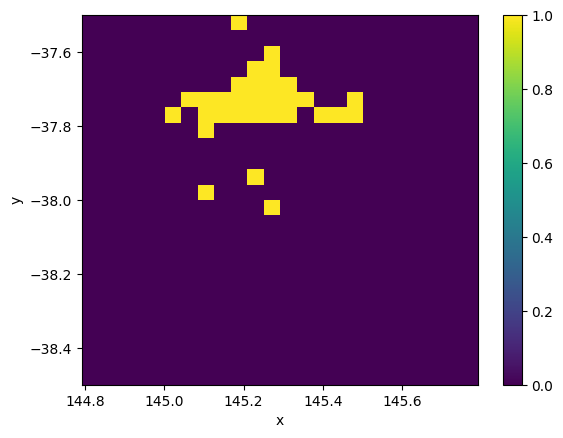

Loading data
Calculating mean
Calculating min
Calculating max


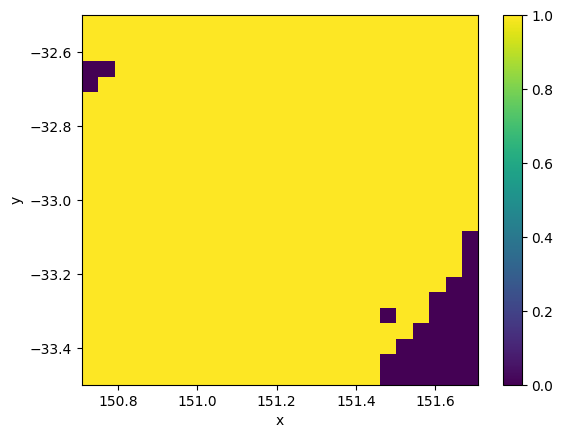

Loading data
Calculating mean
Calculating min
Calculating max


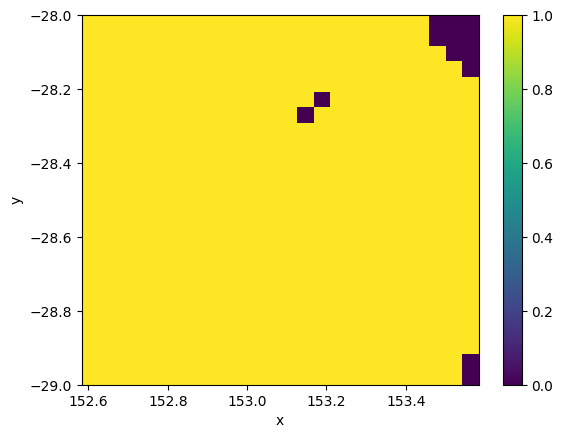

Loading data
Calculating mean
Calculating min
Calculating max


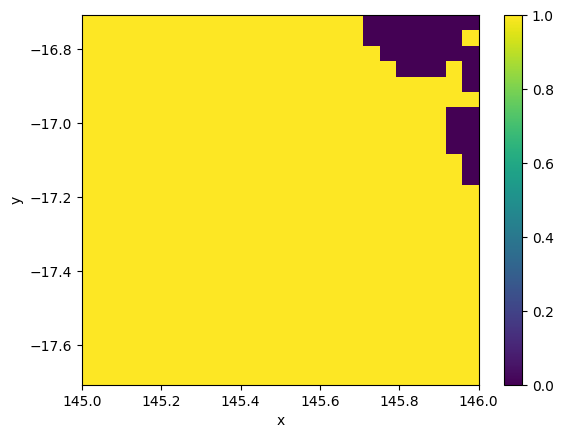

Loading data
Calculating mean
Calculating min
Calculating max


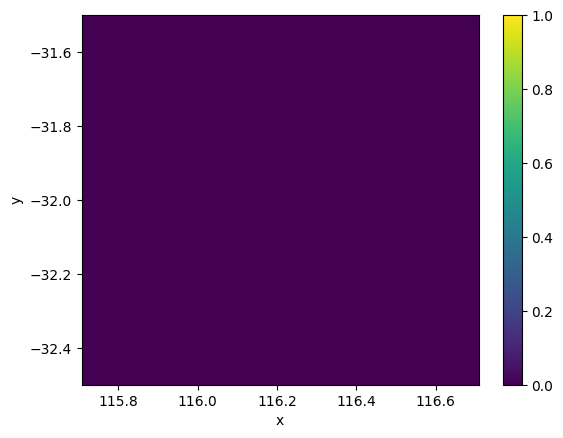

In [74]:


# Measurements to take
assets=['tmax', 'tmin', 'ppt', 'soil', 'aet', 'pet', 'vap', 'pdsi', 'srad', 'vpd', 'swe', 'def', 'ws']

# Features to take, in form '<asset>_<metric>'
features=['tmax_mean', 'tmin_mean', 'ppt_mean', 'soil_mean', 'aet_mean', 'pet_mean', 'vap_mean', 
          'pdsi_mean', 'srad_mean', 'vpd_mean', 'swe_mean', 'def_mean', 'ws_mean']

# Obtain predictor data for each region and get predictor image
for region in test_regions:
    region['coords'] = filter_bbox(test_file[['id', 'decimalLongitude', 'decimalLatitude']], region['bbox'])
    region['predictors'] = get_terraclimate(region['bbox'], tc_metrics, time_slice=time_slice, assets=assets, features=features)
    region['result'] = predict_frogs(region['predictors'], gbm, columns=features) > 0.5
    
    region['result'].plot.imshow(x='x', y='y', vmin=0, vmax=1)
    plt.show()
    

We can now use these classification regions to assign predictions for each of the coordinates specified in the test file. We do this in a similar way to the `join_frogs` function we defined earlier, except in this case we are joining a prediction to each coordinate.


In [75]:
predictions = pd.DataFrame()

for region in test_regions:
    preds = (
        region['result'].rename('occurrenceStatus')
        .sel(
            x=xr.DataArray(region['coords'].decimalLongitude, dims="id", coords={"id": region['coords'].id}), 
            y=xr.DataArray(region['coords'].decimalLatitude, dims="id", coords={"id": region['coords'].id}),
            method="nearest"
        )
        .to_dataframe()
        .reset_index()
        .rename(columns={'x':'decimalLongitude', 'y':'decimalLatitude'})
    )    
    predictions = pd.concat([predictions, preds], axis=0)

if 'occurenceStatus' in test_file.columns:
    test_file.drop(columns={'occurrenceStatus'}, inplace=True)

submission = (    
    predictions.merge(
        test_file, 
        on=['id'], 
        suffixes = ('_', ''))
)
submission['occurrenceStatus'] = submission['occurrenceStatus_'] * 1
submission = submission[['id', 'decimalLatitude', 'decimalLongitude', 'occurrenceStatus']]

submission

,id,decimalLatitude,decimalLongitude,occurrenceStatus
0,0,-37.917146,145.207706,0
1,1,-37.750974,144.981501,0
2,2,-37.961600,145.348000,0
3,3,-37.621300,145.003000,0
4,4,-38.498100,145.647000,0
...,...,...,...,...
4046,4046,-31.884385,116.150192,0
4047,4047,-32.412962,115.779737,0
4048,4048,-32.147959,115.856628,0
4049,4049,-31.827000,116.238000,0


What we are left with is a submission file with three columns: decimalLatitude, decimalLongitude, and occurrenceStatus. This is the file you will submit to the EY Data Science Challenge platform to receive your score on the leaderboard.

In [76]:
display(submission)

# Save to output folder
submission.to_csv(storage_path+'my_challenge_1_lightGBM_submission.csv', index=None)

,id,decimalLatitude,decimalLongitude,occurrenceStatus
0,0,-37.917146,145.207706,0
1,1,-37.750974,144.981501,0
2,2,-37.961600,145.348000,0
3,3,-37.621300,145.003000,0
4,4,-38.498100,145.647000,0
...,...,...,...,...
4046,4046,-31.884385,116.150192,0
4047,4047,-32.412962,115.779737,0
4048,4048,-32.147959,115.856628,0
4049,4049,-31.827000,116.238000,0


In [77]:
submission[submission['occurrenceStatus'] == 1].shape

(2259, 4)

In [78]:
submission.shape

(4051, 4)

### Get Frogging!

Now that you have witnessed a basic approach to model training, its time to try your own approach! Feel free to modify any of the functions presented in this notebook. A good start might be to try running this notebook on a region different to Greater Sydney, or even on multiple regions.

Be sure to address some of the assumptions made here, particularly ways to address the sampling bias in the dataset. Our pseudo-absence method was just one idea, you may want to persue another. Another important issue to consider is that of class imbalance. In this notebook, we simply down-sampled the non-target species to match the number of target species. This may not be ideal, as an isolated frog occurrence may be lost while clusters of occurrences are more likely to persist. Perhaps a method of sampling only from clustered occurrences would address class imbalance while also helping to offset the sampling bias. Just a thought! You might even decide on a completely different training set, such as classifying regions rather than points. Do whatever you think will create the best model for predicting the frog habitats of the species of interest. Happy frogging!